In [1]:
import pandas as pd
import numpy as np
import mma
import skimage
import matplotlib.pyplot as plt

plt.rcParams['animation.ffmpeg_path'] = '/home/jparkin/anaconda3/envs/jpdev/bin/ffmpeg'
import matplotlib.animation as anm
import scipy

from IPython.display import HTML
from matplotlib.lines import Line2D
import matplotlib.colors as mpl_colors
import seaborn as sns
mpl_named_colors = ['gray', 'g', 'y', 'r', 'k', 'c']

In [4]:
import os
os.environ["OMP_NUM_THREADS"] = '4'

In [2]:
import importlib
mma = importlib.reload(mma)

plt.style.use('default')
plt.style.use('fast')
# style = plt.style.library['classic']
# for key in style:
#     plt.rcParams[key] = style[key]

In [3]:
with open('./txt_files/unique_good_dirs_nodatadirs.txt', 'r') as f:
    exp_dirs = f.read().splitlines()
i = 0

In [71]:
def plot_positions(cor_pos_df, out_fn=None):
    plt.figure(figsize=(18,18))
    n_pads = len(cor_pos_df.groupby('pad'))
    pad_inds = np.unique(cor_pos_df.pad.values)
    colors = sns.color_palette('Set1', n_colors=n_pads)
    colors_dict = dict(zip(pad_inds, colors))
    for p_i in cor_pos_df.index:
        point_color = colors_dict[np.int(cor_pos_df.loc[p_i,"pad"])]
        plt.plot(np.float(cor_pos_df.x[p_i]),
                 -np.float(cor_pos_df.y[p_i]),
                 '.',
                 label=cor_pos_df.pad[p_i],
                 ms=20,
                 c=point_color)
        plt.text(np.float(cor_pos_df.x[p_i]),
                 -np.float(cor_pos_df.y[p_i]),
                 '{}'.format(cor_pos_df.loc[p_i, 'label']),
                 fontsize=14,
                 rotation=15)
    handles = [Line2D([0],[0],color=colors[xx],marker='o',label=xx) for xx in np.arange(n_pads)]
    plt.legend(handles=handles)
    plt.gca().set_aspect('equal')
#     plt.savefig(out_fn)
#     plt.close('all')


In [219]:
fn_list = [xx for xx in exp_dirs if '191217' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/191217_rpa_thin_attmpt/img_1']


In [220]:
acq = mma.Acquisition(fn_list[0])

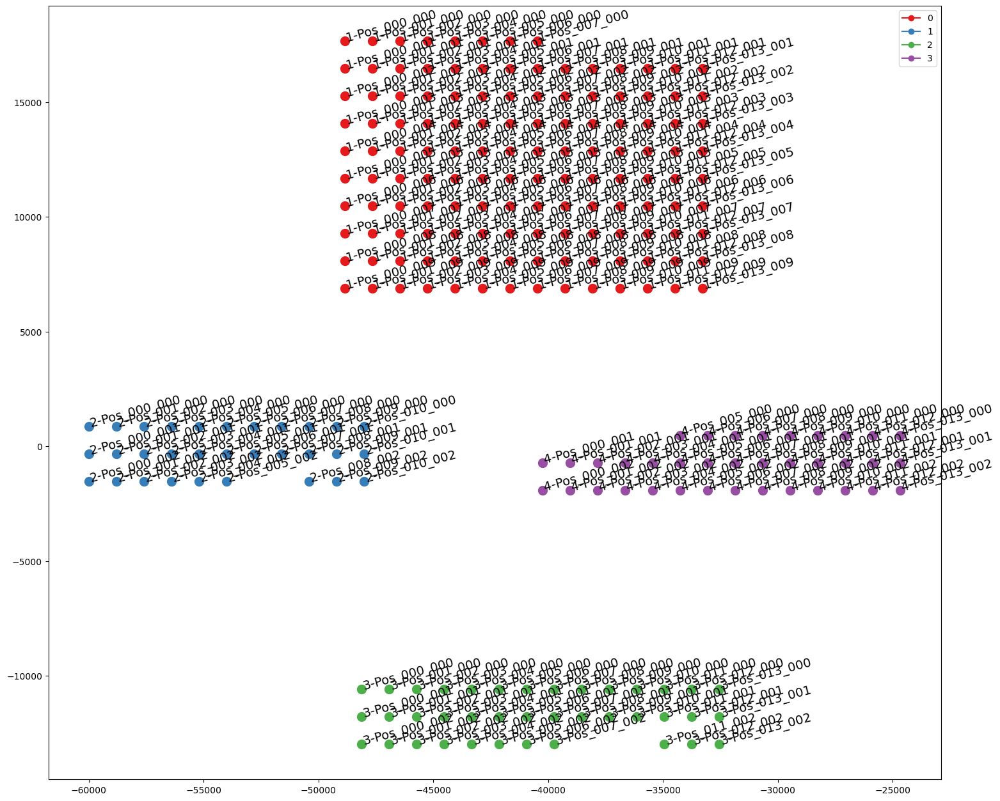

In [112]:
plot_positions(acq.cor_pos_df)

In [221]:
procpad1 = mma.ProcessUnorderedDiff(acq, 0, 2, overwrite=False, bg_option='comb',
                                    sigma=1,bg_sigma=16)
procpad1._load_arrs(False)
procpad2 = mma.ProcessUnorderedDiff(acq, 1, 2, overwrite=False, bg_option='comb',
                                    sigma=1,bg_sigma=16)
procpad2._load_arrs(False)
# import downsampled movie
pad_procs = [procpad1, procpad2]
# pad_styles = ['dashed', 'solid']
pad_styles = ['+', '.']
offset_vals = [2e3, 1300]
rot_vals = [3.8, -11]
np_slices = np.s_[740:1050,3000:600:-1], np.s_[370:500,2200:500:-1]

chan_vals = [0,1,2]
col_vals = ['yellow','orange','blue']
# max_vals = [10000,5000,10000]
# max_vals = [1e4,500,200]
max_vals = [1e4,2e4,3e4]
# max_vals = [100,30,130]

In [222]:
thresh_df = pd.read_csv(os.path.join(acq.super_dir,'csvs','empirical_thresholds.csv'))

In [223]:
thresh_df.head()

,type,ci,frame,threshold
0,arr,0,0,179.046179
1,arr,0,1,287.821838
2,arr,0,2,263.822339
3,arr,0,3,297.030273
4,arr,0,4,290.719519


In [11]:
thresh_df.groupby(['type','ci','frame']).get_group(('arr',chan_ind,frame_ind))['threshold']

NameError: name 'chan_ind' is not defined

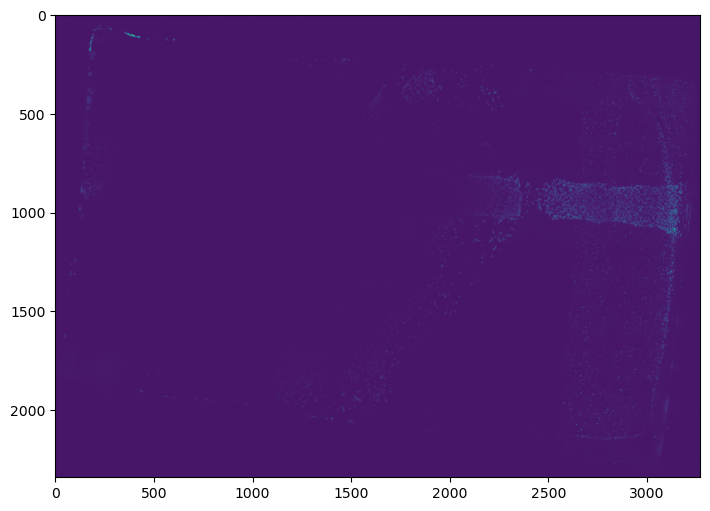

In [248]:
plt.figure(figsize=(9,6))
_ = plt.imshow(procpad1.arr[7,1,:,:])#,vmin=100,vmax=500)
# _ = plt.imshow(procpad1.arr[65,2,:,:],vmin=100,vmax=1000)

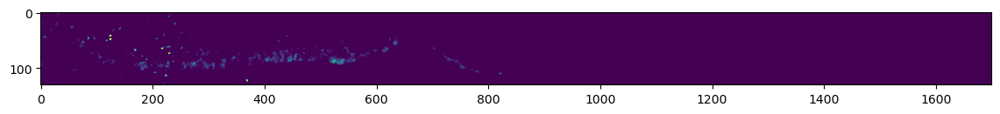

In [93]:
plt.figure(figsize=(14,9))
padind = 1
chan_ind = 1
procpad = pad_procs[padind]
mv = max_vals[chan_ind]
_ = plt.imshow(skimage.transform.rotate(procpad.arr[9,chan_ind,:,:].copy(),rot_vals[padind])[np_slices[padind]][:,:],vmin=mv/10,vmax=mv/2)
# plt.xticks([])
# plt.yticks([])

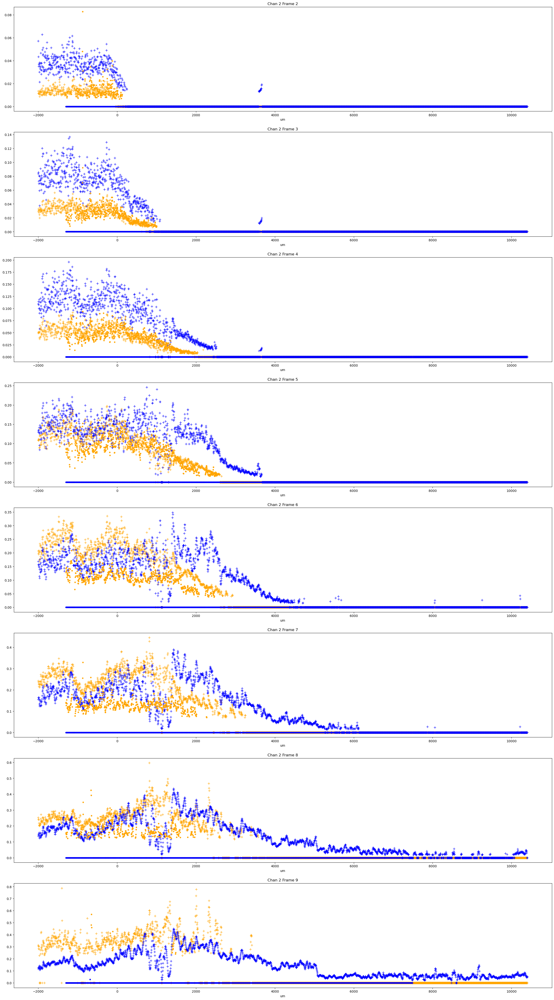

In [224]:

frame_vals = np.arange(2,10,1)
fig, axs = plt.subplots(len(frame_vals),1,figsize=(30,55))
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
#     procpad = mma.ProcessUnorderedDiff(acq, pad_ind, 2, overwrite=False, bg_option='pos_list',sigma=1,bg_sigma=16)
#     procpad._load_arrs(False)
    pixel_size = procpad.pad_helper.pixel_size
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind==0:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
#             if procpad.pad_ind==2:
#                 frame_img[380:465,600:680] = 0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            thresh_val = thresh_df.groupby(['type','ci','frame']).get_group(('arr',chan_ind,frame_ind))['threshold'].values
#             bool_arr = frame_img>(max_val/10)
#             thresh_val = np.max([thresh_val, max_val/20])
            bool_arr = frame_img>(thresh_val)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=3] = 0
            xvec = pixel_size*np.arange(len(plot_vec))-x_off
            plot_vec = plot_vec/max_val
            axs[fi].plot(xvec, plot_vec,c=c,linestyle='none',ms=7,marker=ls)
            axs[fi].set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#             axs[fi].set_ylim([0,1.5])
#             axs[fi].set_xlim([0,2.2e3])
            axs[fi].set_xlabel('um')

chan:1 pad:0 fit:[ 1.45095774 -2.30857499  3.59135497]
chan:1 pad:1 fit:[ 1.34376414 -2.33999531  1.93383498]
chan:2 pad:0 fit:[ 2.42710173 -3.49898972 10.40283   ]


/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:93: UserWarning: Legend does not support None instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists


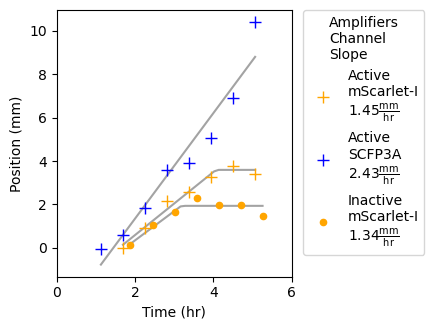

In [186]:
col_vals = ['yellow','orange','blue']
# frame_vals = np.arange(0,25,1)
fig, axs = plt.subplots(1,1,figsize=(4.5,3.4))
handles = [[None,None],[None,None]]
ys = []
cs = []
ts = []
ps = []
dirs = []

frame_vals = np.arange(2,10,1)
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
#     procpad = mma.ProcessUnorderedDiff(acq, pad_ind, 2, overwrite=False, bg_option='pos_list',sigma=1,bg_sigma=16)
#     procpad._load_arrs(False)
    pixel_size = procpad.pad_helper.pixel_size
    pad_ind = procpad.pad_ind
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind < 1:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
#             if procpad.pad_ind==2:
#                 frame_img[380:465,600:680] = 0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
#             bool_arr = frame_img>(max_val/10)
            thresh_val = thresh_df.groupby(['type','ci','frame']).get_group(('arr',chan_ind,frame_ind))['threshold'].values
#             bool_arr = frame_img>(max_val/40)
            thresh_val = np.max([thresh_val, max_val/15])
            bool_arr = frame_img>(thresh_val)

            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=5] = 0
            xvec = pixel_size*np.arange(len(plot_vec))-x_off
            plot_vec = plot_vec/max_val
            t_val = acq.time_df.loc[(frame_ind, pad_ind),'time']/3600
            if np.any(plot_vec>0.05):
                y_val = np.max(xvec[plot_vec>0.05])/1e3
                h = axs.plot(t_val, y_val,c=c,linestyle='none',ms=9,marker=ls)
                handles[procpad.pad_ind][chan_ind-1] = h[0]
                # update lists
                ys.append(y_val)
                ts.append(t_val)
                cs.append(chan_ind)
                ps.append(procpad.pad_ind)
                dirs.append(acq.super_dir)
#             axs.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#             axs.set_ylim([0,4])
            axs.set_xlim([0,6])
            axs.set_xlabel('Time (hr)')
            axs.set_ylabel('Position (mm)')

# def f_fun(t,p):
#     a, b, c = p
#     return a*t + b

# def res_fun(p, t, y):
#     return -1*np.sum(scipy.stats.cauchy.logpdf(f_fun(t,p)-y,scale=1))

def f_fun(t,p):
    a, b, c = p
    return np.array([np.min([c,xx]) for xx in (a*t + b)])

def res_fun(p, t, y):
    return -1*np.sum(scipy.stats.norm.logpdf(f_fun(t,p)-y,scale=0.5))


cols = ['dist','time','channel','fn','pad']
data = [ys, ts, cs, dirs, ps]
fit_df = pd.DataFrame(dict(zip(cols,data)))
labels=['Active\nmScarlet-I\n{:0.2f}',
        'Active\nSCFP3A\n{:0.2f}',
        'Inactive\nmScarlet-I\n{:0.2f}',
        'Inactive\nSCFP3A\n{:0.2f}']
for key, chan_df in fit_df.groupby(['channel','pad']):
    chan, pad = key
    y_vec = chan_df.dist.values
    t_vec = chan_df.time.values
    p0 = np.array([1,-0.5,np.max(y_vec)])
    out = scipy.optimize.minimize(res_fun, p0, args=(t_vec, y_vec))
    color = col_vals[chan]
    sim_t = np.linspace(t_vec.min(),t_vec.max(),30)
    sim_y = f_fun(sim_t, out.x)
    axs.plot(sim_t, sim_y, 'k-',alpha=0.4,zorder=0)
    label_i = (chan-1)+2*(pad)
    label = labels[label_i]
    labels[label_i] = label.format(out.x[0])+r'$\frac{\mathrm{mm}}{\mathrm{hr}}$'
    print('chan:{} pad:{} fit:{}'.format(chan, pad, out.x))

axs.legend(handles=handles[0]+handles[1], labels=labels,title='Amplifiers\nChannel\nSlope',
          bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0.)
fig.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191217_propagation.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191217_propagation.pdf',transparent=True)

In [225]:
out_list = []
# frame_vals = acq.frame_vec
frame_vals = np.arange(2,9,1)
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
    pixel_size = procpad.pad_helper.pixel_size
    start, stop = np_sl[1].start, np_sl[1].stop
    out_arr = np.zeros((3,len(acq.frame_vec), np.abs(stop-start)))
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
#             if procpad.pad_ind==2:
#                 frame_img[290:310,950:1000]=0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=5] = 0
            pv_max = np.max(plot_vec)
            plot_vec = (plot_vec-0.1*max_val)/(0.9*max_val/2)
            out_arr[chan_ind, frame_ind, :] = plot_vec
    out_list.append(out_arr)

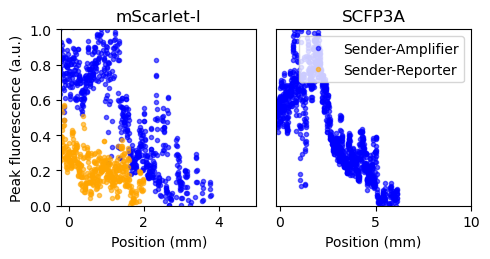

In [227]:
# frame_vals = np.arange(4,15,1)
fig, axs = plt.subplots(1,2,figsize=(5,2.7))
titles = ['mScarlet-I','SCFP3A']
labels = ['Sender-Reporter','Sender-Amplifier'][::-1]
handles = [None, None]
xlim_maxs = [5,10]
for agg_arr, x_off, procpad, c, i in zip(out_list, offset_vals, pad_procs, col_vals[1:][::-1], [0,1]):
    pixel_size = procpad.pad_helper.pixel_size
    xvec = pixel_size*np.arange(agg_arr.shape[-1])-x_off
    for ax, max_val, chan_ind, xmax in zip(axs, max_vals[1:], chan_vals[1:],xlim_maxs):
        if chan_ind==0:
            continue
        max_vec = np.max(agg_arr[chan_ind,:15,:],axis=0)
        bool_vec = max_vec>0
        if np.sum(bool_vec)<31:
            continue
        sub_mx = max_vec[bool_vec]
        sub_xvec = xvec[bool_vec]
        if chan_ind==1:
            sub_mx *= 1.6
            
#         filt_vec = scipy.signal.savgol_filter(sub_mx, 91,3)
        handles[i] = ax.plot(sub_xvec/1e3, sub_mx,'.',c=c,alpha=0.6)[0]
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c='gray',lw=4.8,zorder=20)
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c=c,lw=2,zorder=80)
        ax.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
        ax.set_ylim([0,1])
        ax.set_xlim([-0.2,xmax])
        ax.set_xlabel('Position (mm)')
        ax.set_title(titles[chan_ind-1])
ax.legend(handles=handles,labels=labels)
ax.set_yticks([])
axs[0].set_ylabel('Peak fluorescence (a.u.)')
plt.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191217_amplitude.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191217_amplitude.pdf',transparent=True)

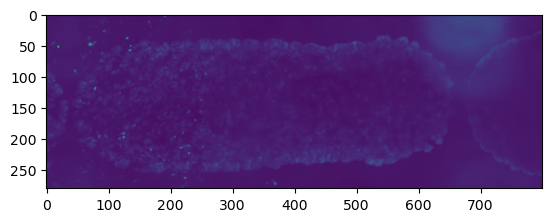

In [82]:
plt.imshow(skimage.transform.rotate(procpad2.arr[9,1,:,:].copy(),rot_vals[1])[np_slices[1]][:,:800])

# frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
# frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]

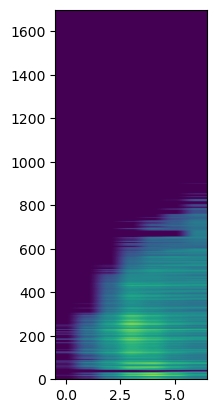

In [95]:
plt.imshow(agg_arr[1,frame_vals,...].T,aspect=1/100,origin='bottom')

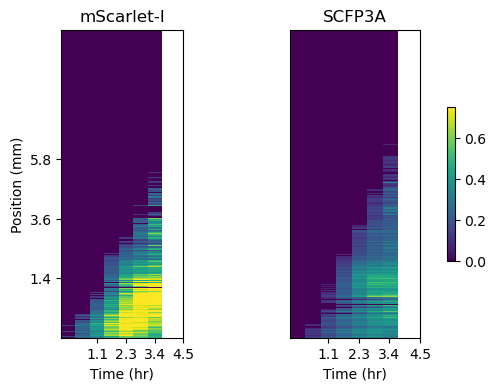

In [112]:
# frame_vals = np.arange(3,25,1)
frame_vals = np.arange(2,9,1)
gs_kw = {'width_ratios':[5,5,1]}
fig, axs = plt.subplots(1,2,figsize=(7,4))#,gridspec_kw=gs_kw)
titles = ['mScarlet-I','SCFP3A']
labels = ['Sender-Reporter','Sender-Amplifier']
handles = [None, None]
for agg_arr, x_off, procpad, c, i in zip(out_list, offset_vals, pad_procs, col_vals[1:], [1,0]):
    if i ==0:
        continue
    _, _, im_h = agg_arr.shape
    pixel_size = procpad.pad_helper.pixel_size
    xvec = pixel_size*np.arange(agg_arr.shape[-1])-x_off
    t_vec = acq.time_df.loc[(frame_vals, procpad.pad_ind),'time']
    for ax, max_val, chan_ind in zip(axs, max_vals[1:], chan_vals[1:]):
        if chan_ind==0:
            continue
        bool_vec = xvec>x_off
        if chan_ind==2:
            h=ax.imshow(agg_arr[chan_ind,frame_vals,:].T,aspect=1/100,origin='bottom',interpolation='none',
                     vmin=0,vmax=0.75)
        else:
            img = agg_arr[chan_ind,frame_vals,:].T.copy()
#             img[np.int(im_h//2)+140:,:] = 0
            ax.imshow(img,aspect=1/100,origin='bottom',interpolation='none',
                     vmin=0,vmax=0.5)
#         ax.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#         ax.set_ylim([0,1.5])
#         ax.set_xlim([-0.2,np.max(sub_xvec)*1.1e-3])
#         xticks = frame_vals[::2]#np.arange(2,22,4)
        ax.set_xticks(xticks)
        ax.set_xticklabels(['{:0.1f}'.format(xx/3600) for xx in t_vec[::2]])
        ax.set_xlabel('Time (hr)')
        ax.set_title(titles[chan_ind-1])
        ax.set_ylim([x_off/pixel_size,im_h])
# ax.legend(handles=handles,labels=labels,
#           bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0.)
ax.set_yticks([])
ax = axs[0]
yticks = np.linspace(x_off/pixel_size,1500,4).astype(np.int)
ax.set_yticks(yticks)
ax.set_yticklabels(['{:0.1f}'.format(xx/1000) for xx in xvec[yticks]])
ax.set_ylim([x_off/pixel_size,im_h])
ax.set_ylabel('Position (mm)')
cbar_im = np.tile(np.linspace(1,0,50).reshape((50,1)),(1,12))
plt.colorbar(h, ax=[axs[0],axs[1]],shrink=0.5)
# axs[-1].imshow(cbar_im,vmin=0,vmax=1)
# axs[-1].set_title('\n\n')
# axs[-1].set_xlabel('\n\n')
# axs[0].set_ylabel('Peak fluorescence (a.u.)')
# fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191212_heatmap.png')
# fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191212_heatmap.pdf')

In [228]:
fn_list = [xx for xx in exp_dirs if '191212' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/191212_rpa_senders_again/bf_final_1', '/groups/murray-biocircuits/jparkin/movies/191212_rpa_senders_again/img_1']


In [229]:
acq = mma.Acquisition(fn_list[1])

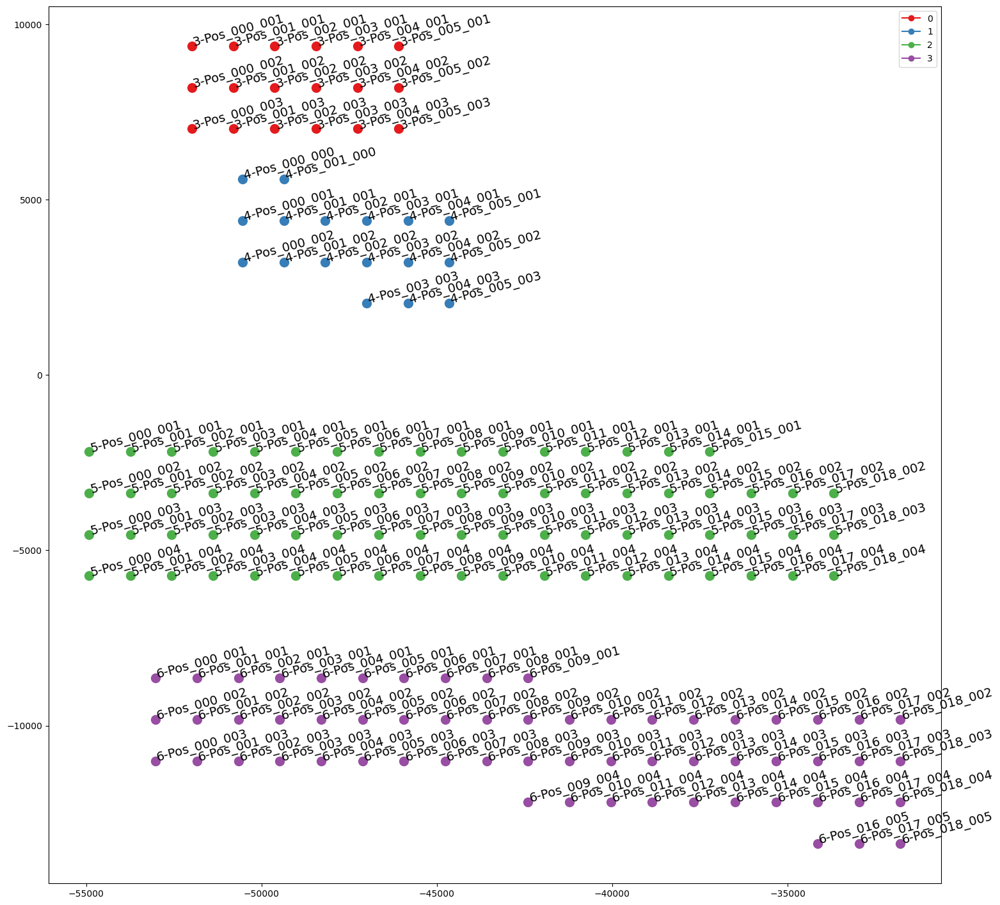

In [37]:
plot_positions(acq.cor_pos_df)

checking out +iptg pad to see -laci mutants

In [29]:
procpad0 = mma.ProcessUnorderedDiff(acq, 0, 2, overwrite=False, bg_option='pos_list',sigma=1,bg_sigma=16)
procpad0._load_arrs(False)


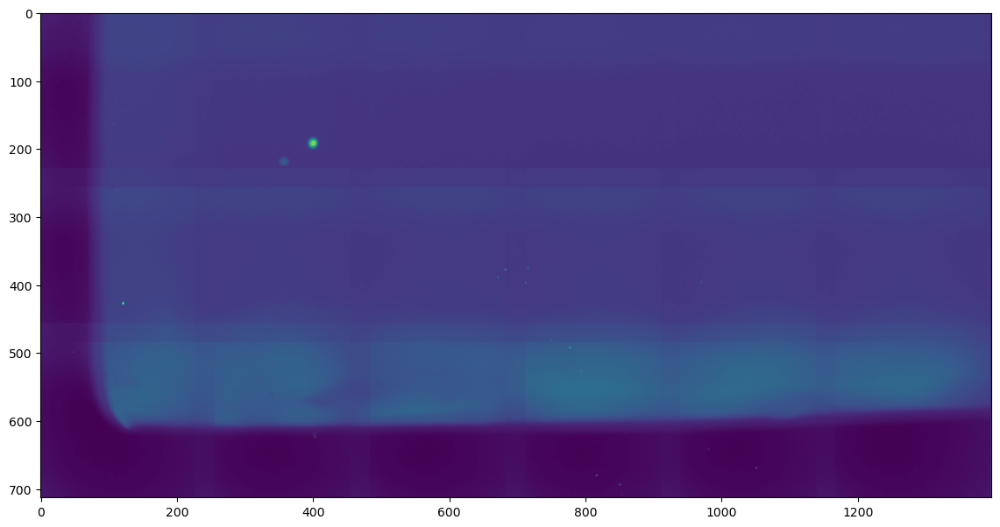

In [34]:
plt.figure(figsize=(14,9))
_ = plt.imshow(procpad0.arr[4,2,:,:])

In [230]:
procpad0 = mma.ProcessUnorderedDiff(acq, 2, 2, overwrite=False, bg_option='pos_list',sigma=1,bg_sigma=16)
procpad0._load_arrs(False)
procpad1 = mma.ProcessUnorderedDiff(acq, 3, 2, overwrite=False, bg_option='pos_list',sigma=1,bg_sigma=16)
procpad1._load_arrs(False)


In [231]:
# import downsampled movie
pad_vals = [2,3]
pad_procs = [procpad0, procpad1]
# pad_styles = ['dashed', 'solid']
pad_styles = ['.', '+']
offset_vals = [575*5.17, 450*5.17]
rot_vals = [2.8, 5,2]
chan_vals = [0,1,2]
col_vals = ['black','orange','blue']
np_slices = np.s_[250:650,500:2200], np.s_[350:550,500:2300]
# max_vals = [10000,5000,10000]
max_vals = [1e4,7e3,3e4]
# max_vals = [100,30,130]

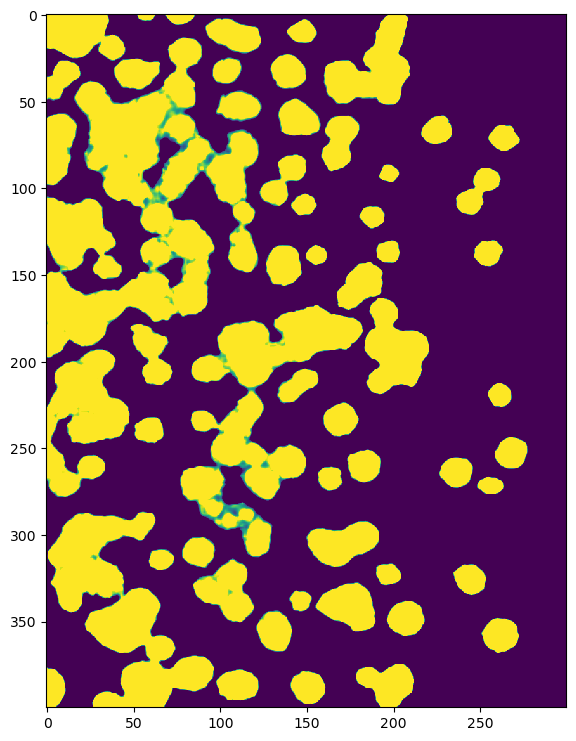

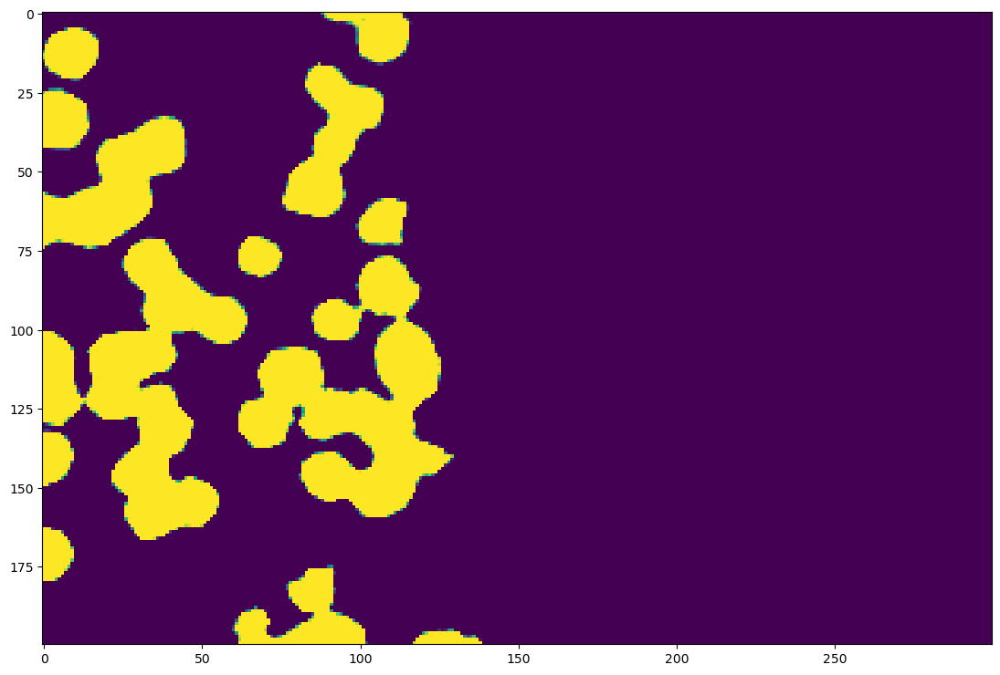

In [419]:
plt.figure(figsize=(14,9))
_ = plt.imshow(skimage.transform.rotate(procpad0.arr[14,0,:,:].copy(),rot_vals[0])[np_slices[0]][:,300:600],vmin=7e3,vmax=1e4)
plt.figure(figsize=(14,9))
_ = plt.imshow(skimage.transform.rotate(procpad1.arr[14,0,:,:].copy(),rot_vals[1])[np_slices[1]][:,300:600],vmin=7e3,vmax=1e4)

In [55]:
anm.writers.avail

/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:1: MatplotlibDeprecationWarning: 
The avail attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  if __name__ == '__main__':


{'pillow': matplotlib.animation.PillowWriter,
 'imagemagick': matplotlib.animation.ImageMagickWriter,
 'imagemagick_file': matplotlib.animation.ImageMagickFileWriter,
 'html': matplotlib.animation.HTMLWriter}

In [58]:
padproc.acq.time_df

time
frame pad              
0     0        0.000000
      1      149.763617
      2      525.890665
      3     1084.625076
1     0     1419.518518
...                 ...
38    3    55211.597754
39    0    55549.629630
      1    55696.940087
      2    56074.968290
      3    56638.329994

[160 rows x 1 columns]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

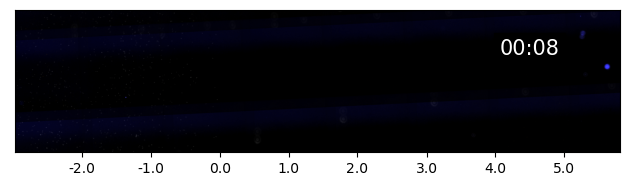

In [89]:
def setup_plot(padproc, x_off, rot_val, np_sl):
    fig, axs = plt.subplots(1,1)
    tmp_arr = skimage.transform.rotate(padproc.arr[0,0,...].copy(),rot_val)[np_sl]
    nh, nw = tmp_arr.shape
    pad_arr = np.zeros((nh, nw, 3))
    h_img = axs.imshow(pad_arr)
    h_txt = axs.text(nw*0.9,2*nh/10,'00:00',fontsize=15,color='white',
                     backgroundcolor='black',horizontalalignment='right',
                    verticalalignment='top')
    ps = padproc.pad_helper.pixel_size
    xvec = ps*np.arange(nw)-x_off
    min_ind = np.arange(nw)[np.abs(xvec)==np.min(np.abs(xvec))]
    hun_ind = np.arange(nw)[np.abs(xvec-1e3)==np.min(np.abs(xvec-1e3))]
    x_step = np.int(min_ind//2)
    xticks = np.array([ii for ii, xx in enumerate(xvec) if (xx%1e3)<=ps])
    xticklabels = xvec[xticks]
    axs.set_xticks(xticks)
    axs.set_xticklabels(['{:0.1f}'.format(xx/1e3) for xx in xticklabels])
    axs.set_yticks([])
    fig.tight_layout()
    return fig, axs, h_img, h_txt

def animate_frame(padproc, x_off, rot_val, np_sl, frame, h_img, h_txt):
    tmp_arr = skimage.transform.rotate(padproc.arr[0,0,...].copy(),rot_val)[np_sl]
    nh, nw = tmp_arr.shape
    img_arr = np.zeros((nh, nw, 3))
    norm_fns = []
    colors_v = ['gray','orange','blue']
    for ci in np.arange(3):
        vmin = np.quantile(padproc.arr[:20,ci,...],0.3)
        vmax = np.quantile(padproc.arr[:20,ci,...],0.9)*4
        vmax = np.max([5e3,vmax])
        norm_fn = mpl_colors.Normalize(vmin, vmax, clip=True)
        norm_fns.append(norm_fn)
        pad_arr = skimage.transform.rotate(padproc.arr[frame,ci,...].copy(),rot_val)[np_sl]
        norm_arr = norm_fn(pad_arr)
        c_vec = mpl_colors.to_rgb(colors_v[ci])
        for img_ci in np.arange(3):
            img_arr[:,:,img_ci] += c_vec[img_ci]*norm_arr
    h_img.set_array(img_arr)
    tval = padproc.acq.time_df.loc[(frame,padproc.pad_ind),'time']
    hrs, mins = np.int(tval//3600), np.int((tval%3600)//60)
    h_txt.set_text('{:02d}:{:02d}'.format(hrs,mins))

pad_ind = 0
np_sl = np_slices[pad_ind]
frame=9
padproc, x_off, rot_val, = pad_procs[pad_ind], offset_vals[pad_ind], rot_vals[pad_ind]
np_sl, frame = np_slices[pad_ind], 12
fig, axs, h_arr, h_txt = setup_plot(padproc, x_off, rot_val, np_sl)
# animate_frame(padproc, x_off, rot_val, np_sl, frame, h_arr, h_txt)
frame_vec = np.arange(17)
# fig, axs, h = setup_plot(padproc, x_off, rot_val, np_sl)
anim_lamb = lambda frame : animate_frame(padproc, x_off, rot_val, np_sl, frame, h_arr,h_txt)
anim = anm.FuncAnimation(fig, anim_lamb, interval=100, frames=frame_vec)
out_fn = 'anims/defanims/{}_pad{}.gif'.format('191217',pad_ind)
anim.save(out_fn, dpi=80,fps=3,writer='pillow',savefig_kwargs={'transparent': True, 'facecolor': 'none'})


# fig, ax = plt.subplots(1,1)


In [18]:
def write_movie_no_bg(out_fn, padproc, rot_val, np_sl, frame_vals):
    # Get movie metadata
    
    def animate(i):
        img_arr = np.zeros((pad_h, pad_w, 3))
        pad_arr[:] = 0
        get_frame_arr(i)
        # For no-bg gifs, normalize relative to the middle frame.
        # Use contrast-stretching approach, where the bounds are the middle 90 percentile
        norm_vec = []
        for chan_ind in np.arange(n_chan):
            frame_vals = pad_arr[:,:,chan_ind][covered_arr].flatten()
            frame_vals = np.sort(frame_vals)
            frame_n = len(frame_vals)
            ind_min, ind_max = np.array([0.05*frame_n, 0.95*frame_n],dtype=np.int)
            vmin, vmax = frame_vals[ind_min], frame_vals[ind_max]
            vmin = np.max([0, vmin])
            vmax = np.max([vmax+vmin,vmin*2])
            norm_fn = mpl_colors.Normalize(vmin, vmax, clip=True)
            norm_vec.append(norm_fn)
        for chan_ind, chan_slot in enumerate(chan_vec):
            norm = norm_vec[chan_ind]
            chan_arr = pad_arr[:,:,chan_ind:chan_ind+1]
            color_vec = mpl_colors.to_rgb(mpl_named_colors[chan_slot])
            img_arr += np.concatenate([norm(chan_arr)*color_val for color_val in color_vec],axis=2)
            key = (pad, i, chan_slot)
            if key in cross_gb.groups.keys():
                segs = vl.get_segments()
                xval = cross_gb.get_group(key).x.mean()/pixel_size
                if flip==1:
                    xval = (pad_w-xlims_vec[pad][1])+xval
                else:
                    xval = xval+xlims_vec[pad][0]
                segs[chan_ind][:,0]=xval
                segs = vl.set_segments(segs)
        if flip==1:
            im.set_array(img_arr[:,::-1,:])
        else:
            im.set_array(img_arr)
        return im, vl
    
    def init():
        out = animate(0)
        return out

    fig, ax = plt.subplots(1, 1, figsize=(fig_w,fig_h+1.2))
    img_arr = np.zeros((pad_h, pad_w, 3))
    vl_colors = [mpl_colors.to_rgb(mpl_named_colors[chan_slot]) for chan_slot in chan_ind_list]
    vl = ax.vlines([0]*n_chan,
                   [0]*n_chan,
                   [pad_h]*n_chan,
                   colors=vl_colors,
                   lw=[10]*n_chan, animated=True)
    
    im = ax.imshow(img_arr.copy(), interpolation='none',animated=True)
    xticks = np.arange(0,pad_w,500/pixel_size)
    xlabs = ['{:0.2f}'.format(xx) for xx in xticks*pixel_size]
    ax.set_xticks(xticks)
    ax.set_xticklabels(xlabs)
    ax.set_yticks([])
    ax.set_xlim([0,pad_w])
    ax.set_title("Pad {}".format(pad_ind))

    fig.tight_layout()

    def init():
        out = animate(0)
        return out
    
    init()
    anim = anm.FuncAnimation(fig, animate, interval=200, frames=frame_vec, init_func=init)
    plt.close('all')
    anim.save(out_fn, dpi=80, fps=1, writer='pillow')
#     return anim
#     return fig, pad_arr
#     fig.savefig(out_fn)
#     plt.close('all')


1700

procpad1.pad_helper.setup_plot()
procpad1.pad_helper.animate(10)


# def prep_img_arr(pad_arr, rot_val, ns_slice):
#     pad_arr = skiamge.transform.rotate(pad_arr, )
#     pad_h, pad_w = pad_arr.shape[:2]
#     self.img_arr[:] = 0
#     # Use contrast-stretching approach, where the bounds are the middle 90 percentile
#     norm_vec = []
#     for chan_ind in np.arange(self.acq.n_chan):
#         frame_vals = self.pad_arr[:,:,chan_ind][self.covered_arr].flatten()
#         frame_vals = np.sort(np.unique(frame_vals))
#         n_vals = len(frame_vals)
#         ind_min, ind_max = np.array([0.1*n_vals, 0.95*n_vals-1],dtype=np.int)
#         vmin, vmax = frame_vals[ind_min], frame_vals[ind_max]
#         vmin = np.max([20,vmin])
#         vmax = np.max([vmax+vmin,vmin*2])
#         norm_fn = mpl_colors.Normalize(vmin, vmax, clip=True)
#         norm_vec.append(norm_fn)
#     for chan_ind, chan_slot in enumerate(self.chan_vec):
#         norm = norm_vec[chan_ind]
#         chan_arr = self.pad_arr[:,:,chan_ind:chan_ind+1]
#         color_vec = mpl_colors.to_rgb(mpl_named_colors[chan_slot])
#         self.img_arr += np.concatenate([norm(chan_arr)*color_val for color_val in color_vec],axis=2)

# plt.style.reload_library()
# plt.style.use('fast')
pixel_size = procpad0.pad_helper.pixel_size
# plt.rcParams['xtick.bottom'] = True
xticklabels = np.arange(0,14,2.5)
xticklabels_str = ['{:0.1f}'.format(xx) for xx in xticklabels-5]
xticks = xticklabels*1e3/pixel_size
img_rot = skimage.transform.rotate(procpad1.pad_helper.img_arr.copy(),rot_vals[1],resize=True)[450:900,:2500]
fig, ax = plt.subplots(1,1,figsize=(8,2))
ax.grid(False)
ax.set_yticks([])
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels_str)
ax.set_xlabel('Position (mm)')


from matplotlib.path import Path
import matplotlib.patches as patches
im_h, im_w = img_rot.shape[:2]
bar_height = im_h/10
sender_width = 3.9e3/pixel_size
sender_orix = 5e3/pixel_size
sender_oriy = 6*bar_height
sender_region = [
   (sender_orix, sender_oriy),  # left, bottom
   (sender_orix, bar_height+sender_oriy),  # left, top
   (sender_orix-sender_width, bar_height+sender_oriy),  # right, top
   (sender_orix-sender_width, 0+sender_oriy),  # right, bottom
   (0., 0.),  # ignored
]

mscar_width = 2e3/pixel_size
mscar_orix = 5e3/pixel_size
mscar_oriy = 7.2*bar_height
mscar_region = [
   (mscar_orix, mscar_oriy),  # left, bottom
   (mscar_orix, bar_height+mscar_oriy),  # left, top
   (mscar_orix+mscar_width, bar_height+mscar_oriy),  # right, top
   (mscar_orix+mscar_width, 0+mscar_oriy),  # right, bottom
   (0., 0.),  # ignored
]

mscar_width = 4e3/pixel_size
mscar_orix = 5e3/pixel_size
mscar_oriy = 8.4*bar_height
cfp_region = [
   (mscar_orix, mscar_oriy),  # left, bottom
   (mscar_orix, bar_height+mscar_oriy),  # left, top
   (mscar_orix+mscar_width, bar_height+mscar_oriy),  # right, top
   (mscar_orix+mscar_width, 0+mscar_oriy),  # right, bottom
   (0., 0.),  # ignored
]


codes = [
    Path.MOVETO,
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,
    Path.CLOSEPOLY,
]

patch_list = []
path = Path(sender_region, codes)
patch = patches.PathPatch(path, facecolor='yellow',edgecolor=(0,0.1,0), lw=0.5)
patch_list.append(patch)
path = Path(mscar_region, codes)
patch = patches.PathPatch(path, facecolor='orange',edgecolor=(0,0.1,0), lw=0.5)
patch_list.append(patch)
path = Path(cfp_region, codes)
patch = patches.PathPatch(path, facecolor='blue',edgecolor=(1,1,1), lw=0.5)
patch_list.append(patch)

ax.imshow(img_rot)
for patch in patch_list:
    ax.add_patch(patch)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/example_sender_amplifier_patches.png')
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/example_sender_amplifier_patches.pdf')

# plt.rcParams['xtick.bottom'] = False

procpad0.pad_helper.setup_plot()
procpad0.pad_helper.animate(10)

acq.time_df.loc[(10,2),'time']/3600

# plt.style.reload_library()
# plt.style.use('fast')
pixel_size = procpad0.pad_helper.pixel_size
# plt.rcParams['xtick.bottom'] = True
xticklabels = np.arange(0.5,14,2.5)
xticklabels_str = ['{:0.1f}'.format(xx) for xx in xticklabels-5.5]
xticks = xticklabels*1e3/pixel_size
img_rot = skimage.transform.rotate(procpad0.pad_helper.img_arr.copy(),rot_vals[0],resize=True)[450:900,:2500]
fig, ax = plt.subplots(1,1,figsize=(8,2))
ax.grid(False)
ax.set_yticks([])
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels_str)
ax.set_xlabel('Position (mm)')


from matplotlib.path import Path
import matplotlib.patches as patches
im_h, im_w = img_rot.shape[:2]
bar_height = im_h/10
sender_width = 3.9e3/pixel_size
sender_orix = 5.5e3/pixel_size
sender_oriy = 6*bar_height
sender_region = [
   (sender_orix, sender_oriy),  # left, bottom
   (sender_orix, bar_height+sender_oriy),  # left, top
   (sender_orix-sender_width, bar_height+sender_oriy),  # right, top
   (sender_orix-sender_width, 0+sender_oriy),  # right, bottom
   (0., 0.),  # ignored
]

mscar_width = 1.2e3/pixel_size
mscar_orix = 5.5e3/pixel_size
mscar_oriy = 7.2*bar_height
mscar_region = [
   (mscar_orix, mscar_oriy),  # left, bottom
   (mscar_orix, bar_height+mscar_oriy),  # left, top
   (mscar_orix+mscar_width, bar_height+mscar_oriy),  # right, top
   (mscar_orix+mscar_width, 0+mscar_oriy),  # right, bottom
   (0., 0.),  # ignored
]

codes = [
    Path.MOVETO,
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,
    Path.CLOSEPOLY,
]

patch_list = []
path = Path(sender_region, codes)
patch = patches.PathPatch(path, facecolor='yellow',edgecolor=(0,0.1,0), lw=0.5)
patch_list.append(patch)
path = Path(mscar_region, codes)
patch = patches.PathPatch(path, facecolor='orange',edgecolor=(0,0.1,0), lw=0.5)
patch_list.append(patch)

ax.imshow(img_rot)
for patch in patch_list:
    ax.add_patch(patch)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/example_sender_receiver_amplifier_patches.png')
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/example_sender_receiver_amplifier_patches.pdf')

# plt.rcParams['xtick.bottom'] = False

In [44]:
np_slices[0][0].start

250

In [232]:
out_list = []
frame_vals = acq.frame_vec
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
    pixel_size = procpad.pad_helper.pixel_size
    start, stop = np_sl[1].start, np_sl[1].stop
    out_arr = np.zeros((3,len(acq.frame_vec), stop-start))
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            if procpad.pad_ind==2:
                frame_img[290:310,950:1000]=0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=15] = 0
            plot_vec = (plot_vec-0.1*max_val)/(0.9*max_val)
            out_arr[chan_ind, frame_ind, :] = plot_vec
    out_list.append(out_arr)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


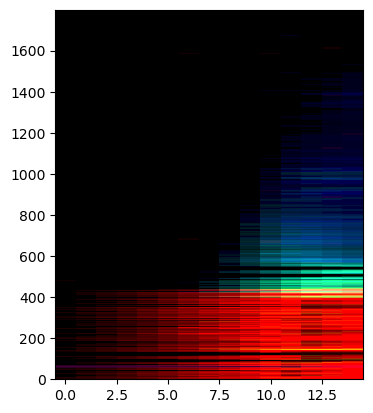

In [108]:
plt.imshow(out_list[1][:,:15,:].T,aspect=1/100, origin='bottom',interpolation='none')

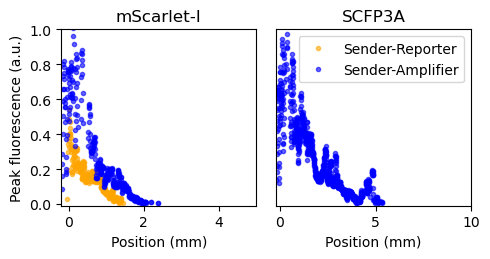

In [235]:
frame_vals = np.arange(4,18,1)
fig, axs = plt.subplots(1,2,figsize=(5,2.7))
titles = ['mScarlet-I','SCFP3A']
labels = ['Sender-Reporter','Sender-Amplifier']
handles = [None, None]
xlim_maxs = [5,10]
for agg_arr, x_off, procpad, c, i in zip(out_list, offset_vals, pad_procs, col_vals[1:], [0,1]):
    pixel_size = procpad.pad_helper.pixel_size
    xvec = pixel_size*np.arange(agg_arr.shape[-1])-x_off
    for ax, max_val, chan_ind, xmax, in zip(axs, max_vals[1:], chan_vals[1:], xlim_maxs):
        if chan_ind==0:
            continue
        max_vec = np.max(agg_arr[chan_ind,:15,:],axis=0)
        bool_vec = max_vec>0
        if np.sum(bool_vec)<31:
            continue
        sub_mx = max_vec[bool_vec]
        if chan_ind==1:
            sub_mx /= 2
        sub_xvec = xvec[bool_vec]
#         filt_vec = scipy.signal.savgol_filter(sub_mx, 91,3)
        handles[i] = ax.plot(sub_xvec/1e3, sub_mx,'.',c=c,alpha=0.6)[0]
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c='gray',lw=4.8,zorder=20)
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c=c,lw=2,zorder=80)
        ax.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
        ax.set_ylim([-0.01,1])
        ax.set_xlim([-0.2,xmax])
        ax.set_xlabel('Position (mm)')
        ax.set_title(titles[chan_ind-1])
ax.legend(handles=handles,labels=labels)
ax.set_yticks([])
axs[0].set_ylabel('Peak fluorescence (a.u.)')
plt.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191212_amplitude.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191212_amplitude.pdf',transparent=True)

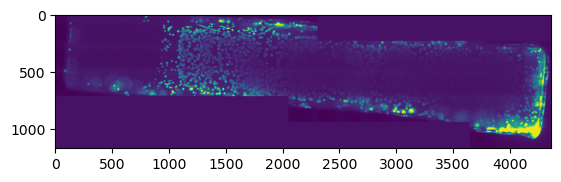

In [212]:
plt.imshow(procpad1.arr[15,2,:,:])

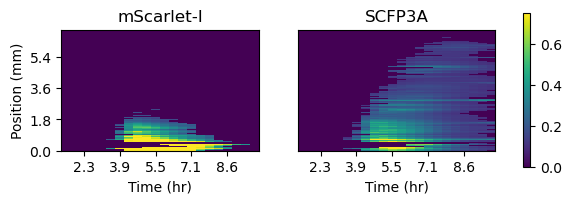

In [22]:
frame_vals = np.arange(3,25,1)
gs_kw = {'width_ratios':[5,5,1]}
fig, axs = plt.subplots(1,2,figsize=(7,4))#,gridspec_kw=gs_kw)
titles = ['mScarlet-I','SCFP3A']
labels = ['Sender-Reporter','Sender-Amplifier']
handles = [None, None]
for agg_arr, x_off, procpad, c, i in zip(out_list, offset_vals, pad_procs, col_vals[1:], [0,1]):
    if i ==0:
        continue
    _, _, im_h = agg_arr.shape
    pixel_size = procpad.pad_helper.pixel_size
    xvec = pixel_size*np.arange(agg_arr.shape[-1])-x_off
    t_vec = acq.time_df.loc[(frame_vals, procpad.pad_ind),'time']
    for ax, max_val, chan_ind in zip(axs, max_vals[1:], chan_vals[1:]):
        if chan_ind==0:
            continue
        bool_vec = xvec>x_off
        if chan_ind==2:
            h=ax.imshow(agg_arr[chan_ind,frame_vals,:].T,aspect=1/100,origin='bottom',interpolation='none',
                     vmin=0,vmax=0.75)
        else:
            img = agg_arr[chan_ind,frame_vals,:].T.copy()
            img[np.int(im_h//2)+140:,:] = 0
            ax.imshow(img,aspect=1/100,origin='bottom',interpolation='none',
                     vmin=0,vmax=0.5)
#         ax.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#         ax.set_ylim([0,1.5])
#         ax.set_xlim([-0.2,np.max(sub_xvec)*1.1e-3])
        xticks = np.arange(2,22,4)
        ax.set_xticks(xticks)
        ax.set_xticklabels(['{:0.1f}'.format(xx/3600) for xx in t_vec[xticks]])
        ax.set_xlabel('Time (hr)')
        ax.set_title(titles[chan_ind-1])
        ax.set_ylim([x_off/pixel_size,im_h])
# ax.legend(handles=handles,labels=labels,
#           bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0.)
ax.set_yticks([])
ax = axs[0]
yticks = np.linspace(x_off/pixel_size,1500,4).astype(np.int)
ax.set_yticks(yticks)
ax.set_yticklabels(['{:0.1f}'.format(xx/1000) for xx in xvec[yticks]])
ax.set_ylim([x_off/pixel_size,im_h])
ax.set_ylabel('Position (mm)')
cbar_im = np.tile(np.linspace(1,0,50).reshape((50,1)),(1,12))
plt.colorbar(h, ax=[axs[0],axs[1]],shrink=0.5)
# axs[-1].imshow(cbar_im,vmin=0,vmax=1)
# axs[-1].set_title('\n\n')
# axs[-1].set_xlabel('\n\n')
# axs[0].set_ylabel('Peak fluorescence (a.u.)')
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191212_heatmap.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191212_heatmap.pdf',transparent=True)

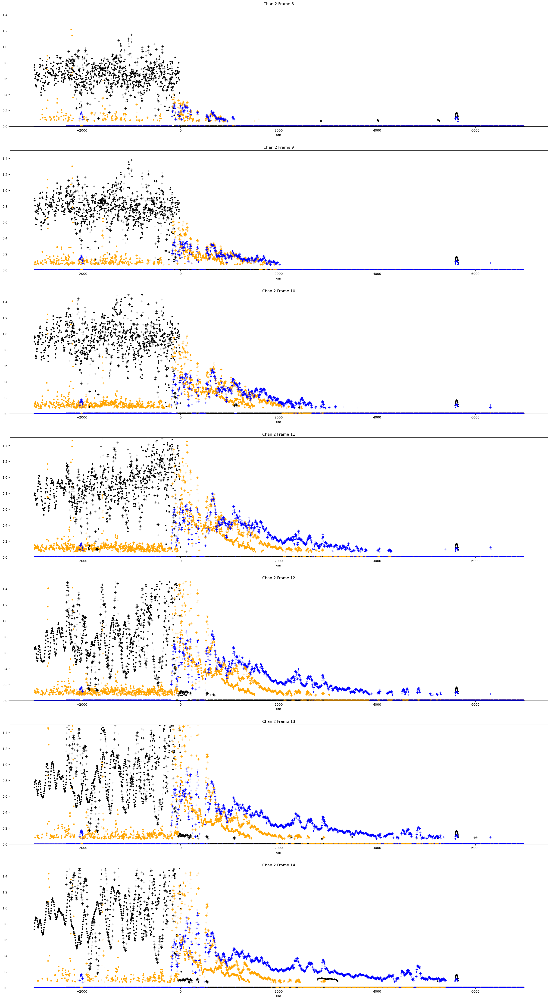

In [199]:
frame_vals = np.arange(8,15,1)
fig, axs = plt.subplots(len(frame_vals),1,figsize=(30,55))
# out_arr = np.zeros(3,len(acq.frame_vec))
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
    pixel_size = procpad.pad_helper.pixel_size
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            if procpad.pad_ind==2:
                frame_img[290:310,950:1000]=0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=1] = 0
            xvec = pixel_size*np.arange(len(plot_vec))-x_off
            plot_vec = plot_vec/max_val
            axs[fi].plot(xvec, plot_vec,c=c,linestyle='none',ms=7,marker=ls)
            axs[fi].set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
            axs[fi].set_ylim([0,1.5])
#             axs[fi].set_xlim([0,2.2e3])
            axs[fi].set_xlabel('um')

chan:1 pad:2 fit:[ 1.51298799 -4.94303833  1.37004994]
chan:1 pad:3 fit:[ 1.76730898 -5.50552334  2.20759003]
chan:2 pad:3 fit:[ 2.32827395 -7.36336934  4.85979999]


/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:97: UserWarning: Legend does not support None instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists


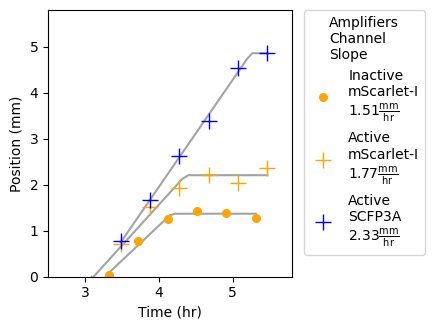

In [207]:
col_vals = ['yellow','orange','blue']
chan_vals = [0,1,2]
# pad_procs = [procpad1, procpad2]
frame_vals = np.arange(4,14,1)
fig, axs = plt.subplots(1,1,figsize=(4.5,3.4))
handles = [[None,None],[None,None]]
ys = []
cs = []
ts = []
ps = []
dirs = []
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
#     procpad = mma.ProcessUnorderedDiff(acq, pad_ind, 2, overwrite=False, bg_option='pos_list',sigma=1,bg_sigma=16)
#     procpad._load_arrs(False)
    pixel_size = procpad.pad_helper.pixel_size
    pad_ind = procpad.pad_ind
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind < 1:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            if procpad.pad_ind==2:
                frame_img[290:310,950:1000]=0
            if procpad.pad_ind==2 and chan_ind==2:
                frame_img[:,1200:]=0
#             if procpad.pad_ind==2:
#                 frame_img[380:465,600:680] = 0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=15] = 0
            xvec = pixel_size*np.arange(len(plot_vec))-x_off
            plot_vec = plot_vec/max_val
            t_val = acq.time_df.loc[(frame_ind, pad_ind),'time']/3600
            if np.any(plot_vec>0.1):
                y_val = np.max(xvec[plot_vec>0.1])/1e3
                h = axs.plot(t_val, y_val,c=c,linestyle='none',ms=11,marker=ls)
                handles[procpad.pad_ind-2][chan_ind-1] = h[0]
                # update lists
                ys.append(y_val)
                ts.append(t_val)
                cs.append(chan_ind)
                ps.append(procpad.pad_ind)
                dirs.append(acq.super_dir)
#             axs.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#             axs.set_ylim([0,4])
#             axs[fi].set_xlim([0,2.2e3])
            axs.set_xlim([2.5,5.8])
            axs.set_ylim([0,5.8])
            axs.set_xlabel('Time (hr)')
            axs.set_ylabel('Position (mm)')

def f_fun(t,p):
    a, b, c = p
    return np.array([np.min([c,xx]) for xx in (a*t + b)])

def res_fun(p, t, y):
    return -1*np.sum(scipy.stats.norm.logpdf(f_fun(t,p)-y,scale=0.1))
#     return -1*np.sum(scipy.stats.cauchy.logpdf(f_fun(t,p)-y,scale=0.1))

cols = ['dist','time','channel','fn','pad']
data = [ys, ts, cs, dirs, ps]
fit_df = pd.DataFrame(dict(zip(cols,data)))
labels=['Inactive\nmScarlet-I\n{:0.2f}',
        'Inactive\nSCFP3A\n{:0.2f}',
        'Active\nmScarlet-I\n{:0.2f}',
        'Active\nSCFP3A\n{:0.2f}']
handles = handles[0]+handles[1]
for key, chan_df in fit_df.groupby(['channel','pad']):
    chan, pad = key
    chan_df = chan_df.copy()
#     chan_df['dist'] = 0.01*(chan_df['dist'].values//0.01)
#     chan_df = chan_df[['dist','time']].groupby('dist').agg(np.min).reset_index()
    y_vec = chan_df.dist.values
    t_vec = chan_df.time.values
    p0 = np.array([1,-8,np.max(y_vec)])
    out = scipy.optimize.minimize(res_fun, p0, args=(t_vec, y_vec))
    if out.x[0]>0.1:
        color = col_vals[chan]
        sim_t = np.linspace(t_vec.min(),t_vec.max(),30)
        sim_y = f_fun(sim_t, out.x)
        axs.plot(sim_t, sim_y, 'k-',alpha=0.4,zorder=0)
        label_i = (chan-1)+2*(pad-2)
        label = labels[label_i]
        labels[label_i] = label.format(out.x[0])+r'$\frac{\mathrm{mm}}{\mathrm{hr}}$'
        print('chan:{} pad:{} fit:{}'.format(chan, pad, out.x))
    else:
        label_i = (chan-1)+2*(pad-2)
        labels[label_i] = None
        handles[label_i] = None
        

axs.legend(handles=handles, labels=labels,title='Amplifiers\nChannel\nSlope',
          bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0.)
fig.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191212_propagation.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191212_propagation.pdf',transparent=True)

In [2]:
(2.21-1.37)/1.37

0.6131386861313867

In [250]:
fn_list = [xx for xx in exp_dirs if '180711' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/180711/20180711_1']


In [251]:
acq = mma.Acquisition(fn_list[0])

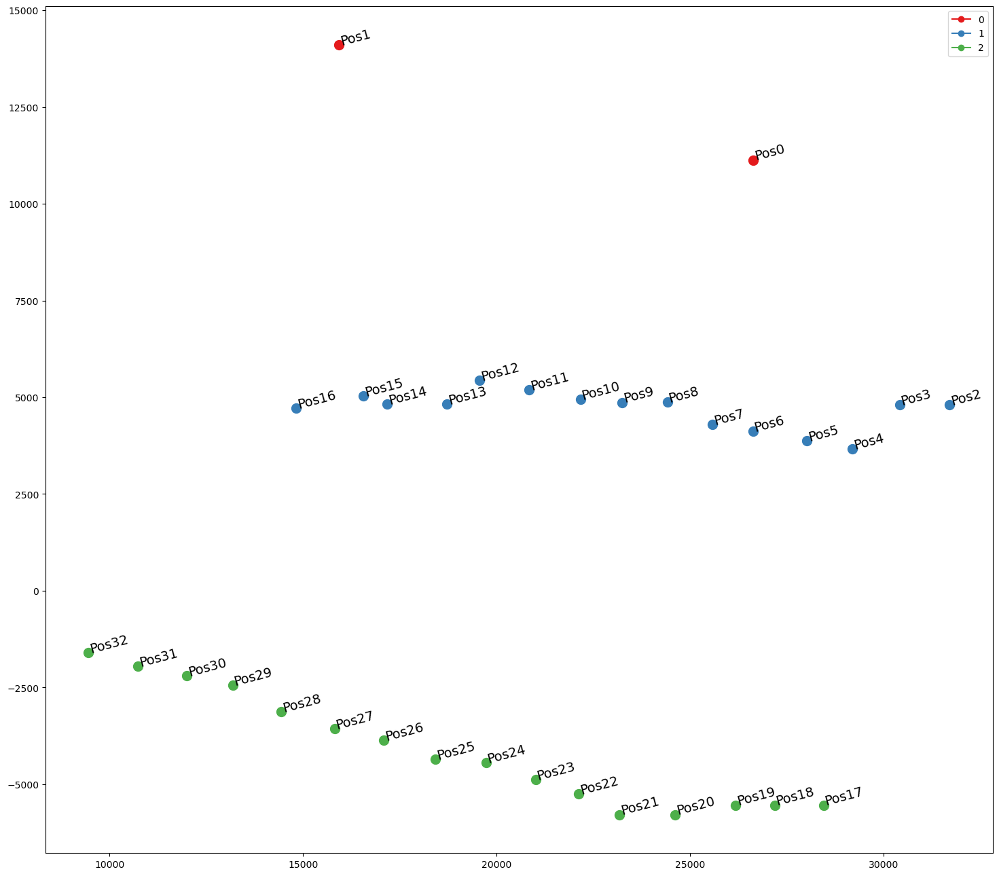

In [25]:
plot_positions(acq.cor_pos_df)

In [253]:
procpad1 = mma.ProcessUnorderedDiff(acq, pad_ind=1, scale=8, sigma=1, sg_width=7, sg_order=3, bg_sigma=16, overwrite=False,bg_option='comb')
procpad2 = mma.ProcessUnorderedDiff(acq, pad_ind=2, scale=8, sigma=1, sg_width=7, sg_order=3, bg_sigma=16, overwrite=False,bg_option='comb')
procpad1._load_arrs(False)
procpad2._load_arrs(False)
# import downsampled movie
pad_procs = [procpad1, procpad2]
# pad_styles = ['dashed', 'solid']
pad_styles = ['.', '+']
offset_vals = [200*6.5, 75*6.5]
rot_vals = [0, 17]
np_slices = np.s_[:,-1:300:-1], np.s_[:,-1:300:-1]
chan_vals = [0,1,2]
col_vals = ['yellow','orange','blue']
# max_vals = [10000,5000,10000]
max_vals = [1e4,900,80]
# max_vals = [100,30,130]

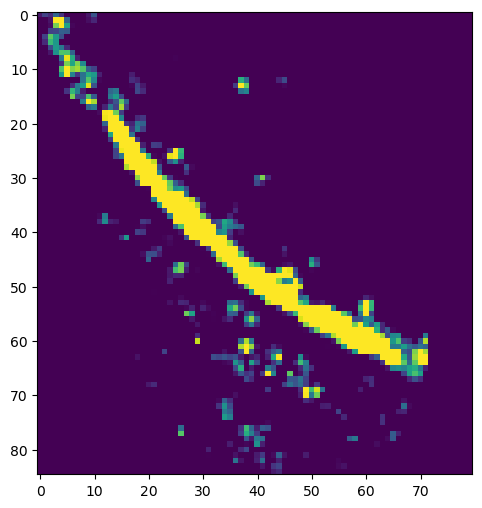

In [143]:
plt.figure(figsize=(15,6))
_ = plt.imshow(skimage.transform.rotate(procpad2.arr[10,2,:,:].copy(),17)[np_slices[1]][380:465,600:680],vmin=20,vmax=100)

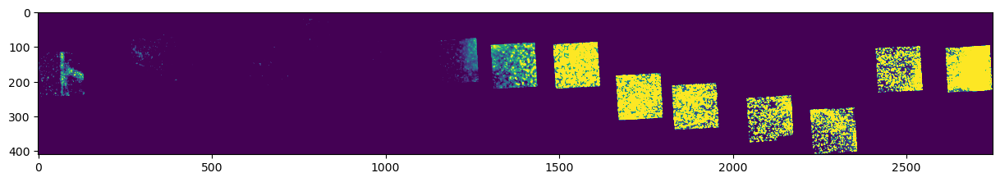

In [144]:
plt.figure(figsize=(15,6))
_ = plt.imshow(procpad1.arr[65,1,:,:],vmin=100,vmax=500)
# _ = plt.imshow(procpad1.arr[65,2,:,:],vmin=100,vmax=1000)

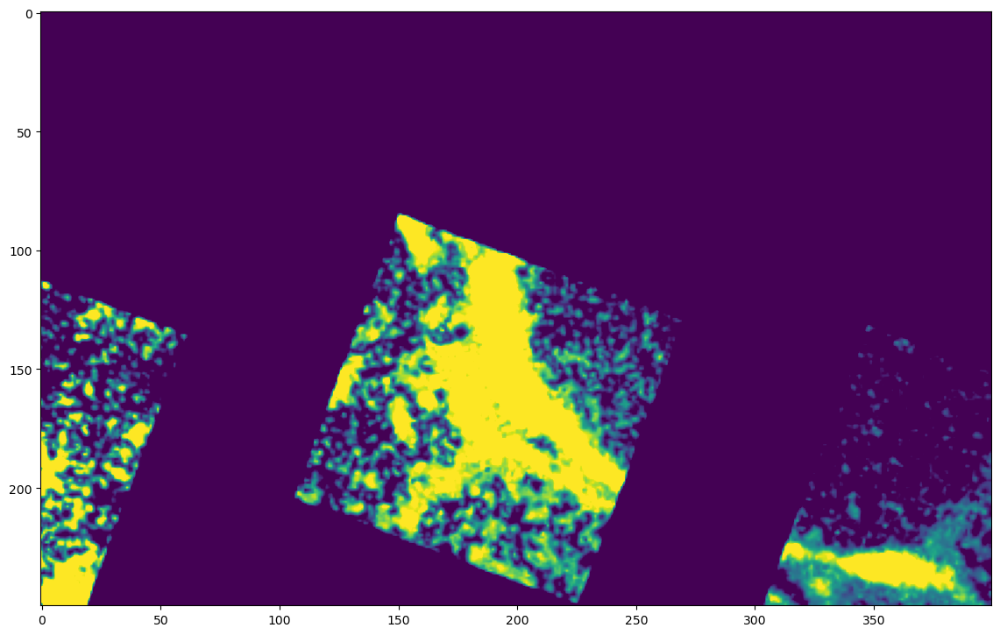

In [38]:
plt.figure(figsize=(14,9))
padind = 1
procpad = pad_procs[padind]
_ = plt.imshow(skimage.transform.rotate(procpad.arr[45,1,:,:].copy(),rot_vals[padind])[np_slices[padind]][300:550,1200:1600],vmin=200,vmax=1000)
# plt.xticks([])
# plt.yticks([])

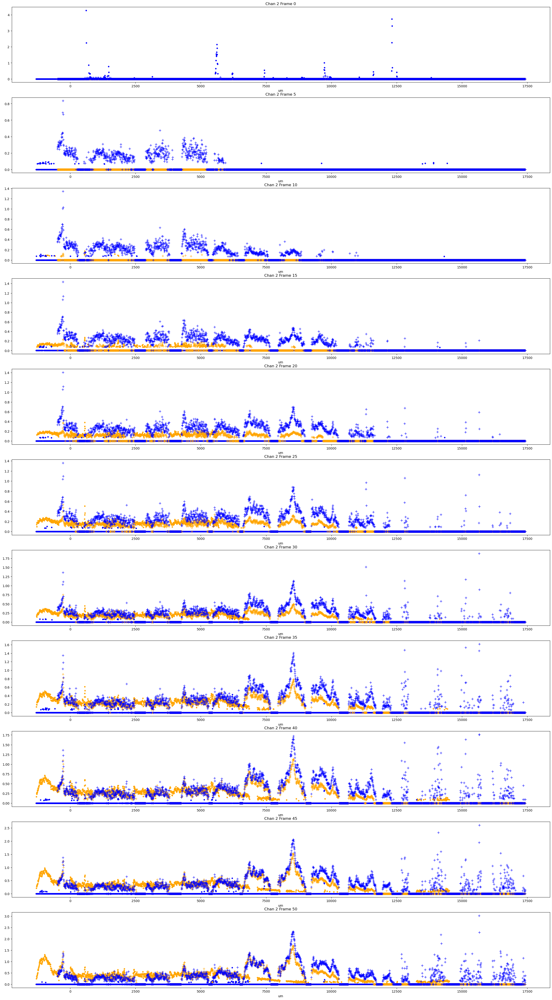

In [29]:

frame_vals = np.arange(0,55,5)
fig, axs = plt.subplots(len(frame_vals),1,figsize=(30,55))
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
#     procpad = mma.ProcessUnorderedDiff(acq, pad_ind, 2, overwrite=False, bg_option='pos_list',sigma=1,bg_sigma=16)
#     procpad._load_arrs(False)
    pixel_size = procpad.pad_helper.pixel_size
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind==0:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            if procpad.pad_ind==2:
                frame_img[380:465,600:680] = 0
                frame_img[300:320,1060:1080] = 0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=1] = 0
            xvec = pixel_size*np.arange(len(plot_vec))-x_off
            plot_vec = plot_vec/max_val
            axs[fi].plot(xvec, plot_vec,c=c,linestyle='none',ms=7,marker=ls)
            axs[fi].set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#             axs[fi].set_ylim([0,1.5])
#             axs[fi].set_xlim([0,2.2e3])
            axs[fi].set_xlabel('um')

chan:1 pad:1 fit:[ 12.98050548 -20.01031037   5.56849985]
chan:1 pad:2 fit:[ 5.6380767  -5.06180016 10.05963482]
chan:2 pad:2 fit:[ 4.24970498  2.95065008 11.57840985]


/home/jparkin/anaconda3/envs/jpdev/lib/python3.7/site-packages/ipykernel/__main__.py:106: UserWarning: Legend does not support 0 instances.
A proxy artist may be used instead.
See: http://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists


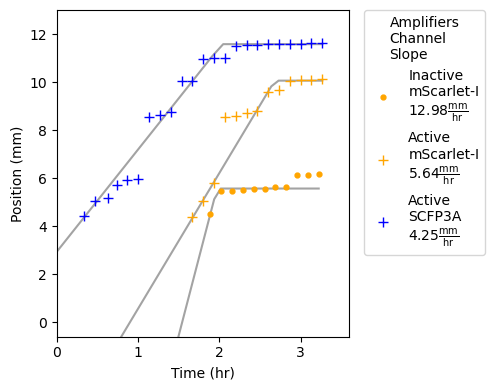

In [31]:
# # import downsampled movie
# pad_vals = [2,3]
# # pad_styles = ['dashed', 'solid']
# pad_styles = ['.', '+']
# offset_vals = [570*5.17, 450*5.17]
# rot_vals = [2.8, 5,2]
# chan_vals = [0,1]#,2]
# col_vals = ['yellow','red','cyan']
# np_slices = np.s_[250:700,500:3000], np.s_[350:600,500:3000]
# max_vals = [100,25,100]
# max_vals = [1e4,1e4,3e4]
ys = []
cs = []
ts = []
ps = []
dirs = []
col_vals = ['yellow','orange','blue']
frame_vals = np.arange(1,25,1)
fig, axs = plt.subplots(1,1,figsize=(5.1,4))
handles = [[0,0],[0,0]]
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
#     procpad = mma.ProcessUnorderedDiff(acq, pad_ind, 2, overwrite=False, bg_option='pos_list',sigma=1,bg_sigma=16)
#     procpad._load_arrs(False)
    pixel_size = procpad.pad_helper.pixel_size
    pad_ind = procpad.pad_ind
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind < 1:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            if procpad.pad_ind==2:
                frame_img[380:465,600:680] = 0
                frame_img[300:320,1060:1080] = 0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=4] = 0
            xvec = pixel_size*np.arange(len(plot_vec))-x_off
            plot_vec = plot_vec/max_val
            t_val = acq.time_df.loc[(frame_ind, pad_ind),'time']/3600
            if np.any(plot_vec>0.15):
                y_val = np.max(xvec[plot_vec>0.05])/1e3
                h = axs.plot(t_val, y_val,c=c,linestyle='none',ms=7,marker=ls)
                handles[procpad.pad_ind-1][chan_ind-1] = h[0]
                # update lists
                ys.append(y_val)
                ts.append(t_val)
                cs.append(chan_ind)
                ps.append(procpad.pad_ind)
                dirs.append(acq.super_dir)
#             axs.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#             axs.set_ylim([0,4])
            axs.set_xlim([0,3.6])
            axs.set_xticks([0,1,2,3])
#             axs[fi].set_xlim([0,2.2e3])
            axs.set_xlabel('Time (hr)')
            axs.set_ylabel('Position (mm)')


def f_fun(t,p):
    a, b, c = p
    return np.array([np.min([c,xx]) for xx in (a*t + b)])

def res_fun(p, t, y):
    return -1*np.sum(scipy.stats.cauchy.logpdf(f_fun(t,p)-y,scale=0.2))

cols = ['dist','time','channel','fn','pad']
data = [ys, ts, cs, dirs, ps]
fit_df = pd.DataFrame(dict(zip(cols,data)))
labels=['Inactive\nmScarlet-I\n{:0.2f}',
        'Inactive\nSCFP3A\n{:0.2f}',
        'Active\nmScarlet-I\n{:0.2f}',
        'Active\nSCFP3A\n{:0.2f}']

for key, chan_df in fit_df.groupby(['channel','pad']):
    chan, pad = key
    chan_df = chan_df.copy()
#     chan_df['dist'] = 0.01*(chan_df['dist'].values//0.01)
#     chan_df = chan_df[['dist','time']].groupby('dist').agg(np.min).reset_index()
    y_vec = chan_df.dist.values
    t_vec = chan_df.time.values
    if pad==1:
        p0 = np.array([13,-20,6])
    else:
        p0 = np.array([5,-0.5,8])
    out = scipy.optimize.minimize(res_fun, p0, args=(t_vec, y_vec))
    if out.x[0]>0.1:
        color = col_vals[chan]
        sim_t = np.linspace(t_vec.min()-1,t_vec.max(),30)
        sim_y = f_fun(sim_t, out.x)
        axs.plot(sim_t, sim_y, 'k-',alpha=0.4,zorder=0)
        label_i = (chan-1)+2*(pad-1)
        label = labels[label_i]
        labels[label_i] = label.format(out.x[0])+r'$\frac{\mathrm{mm}}{\mathrm{hr}}$'
        print('chan:{} pad:{} fit:{}'.format(chan, pad, out.x))
    else:
        label_i = (chan-1)+2*(pad-1)
        labels[label_i] = None
        handles[label_i] = None
        
axs.set_ylim([-0.6,13])
axs.legend(handles=handles[0]+handles[1], labels=labels,title='Amplifiers\nChannel\nSlope',
          bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0.)

fig.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/180711_propagation.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/180711_propagation.pdf',transparent=True)

In [39]:
procpad.arr.shape

(90, 3, 783, 3074)

In [258]:
out_list = []
# frame_vals = acq.frame_vec
frame_vals = np.arange(2,25,1)
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, pad_procs):
    pixel_size = procpad.pad_helper.pixel_size
    start, stop = np_sl[1].start, np_sl[1].stop
    arr_len = skimage.transform.rotate(procpad.arr[0,0,...].copy(),rot_val)[np_sl].shape[1]
    out_arr = np.zeros((3,len(acq.frame_vec), np.abs(arr_len)))
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            if procpad.pad_ind==2:
                frame_img[380:465,600:680] = 0
                frame_img[300:320,1060:1080] = 0

#             if procpad.pad_ind==2:
#                 frame_img[290:310,950:1000]=0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=4] = 0
            plot_vec = plot_vec/max_val
            out_arr[chan_ind, frame_ind, :] = plot_vec
    out_list.append(out_arr)

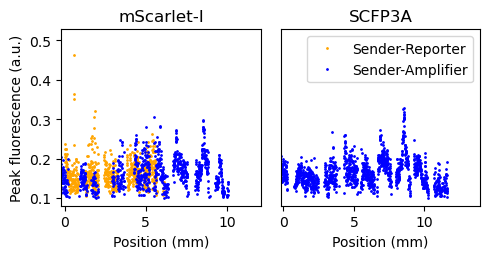

In [259]:
# frame_vals = np.arange(4,15,1)
fig, axs = plt.subplots(1,2,figsize=(5,2.7))
titles = ['mScarlet-I','SCFP3A']
labels = ['Sender-Reporter','Sender-Amplifier']
handles = [None, None]

for agg_arr, x_off, procpad, c, i in zip(out_list, offset_vals, pad_procs, col_vals[1:], [0,1]):
    pixel_size = procpad.pad_helper.pixel_size
    xvec = pixel_size*np.arange(agg_arr.shape[-1])-x_off
    for ax, max_val, chan_ind in zip(axs, max_vals[1:], chan_vals[1:]):
        if chan_ind==0:
            continue
        max_vec = np.max(agg_arr[chan_ind,:25,:],axis=0)
        bool_vec = max_vec>0.1
        if np.sum(bool_vec)<2:
            continue
        sub_mx = max_vec[bool_vec]
        sub_xvec = xvec[bool_vec]
#         filt_vec = scipy.signal.savgol_filter(sub_mx, 91,3)
        handles[i] = ax.plot(sub_xvec/1e3, sub_mx,'.',c=c,ms=2)[0]
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c='gray',lw=4.8,zorder=20)
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c=c,lw=2,zorder=80)
        ax.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#         ax.set_ylim([0,1])
        ax.set_xlim([-0.2,np.max(sub_xvec)*1.2e-3])
        ax.set_xlabel('Position (mm)')
        ax.set_title(titles[chan_ind-1])
ax.legend(handles=handles,labels=labels)
ax.set_yticks([])
axs[0].set_ylabel('Peak fluorescence (a.u.)')
plt.tight_layout()
# fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/180711_amplitude.png',transparent=True)
# fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/180711_amplitude.pdf',transparent=True)

In [32]:
procpad.pad_ind-1

1

In [33]:
fn_list = [xx for xx in exp_dirs if '200309_prs/img_2' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/200309_prs/img_2']


In [34]:
fn_list = [xx for xx in exp_dirs if '200307_prs/img_3' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/200307_prs/img_3']


In [5]:
fn_list = [ii for ii, xx in enumerate(exp_dirs) if '200303_sender_receiver/img_2' in xx]
print(fn_list)

[50]


In [6]:
fn_list = [xx for xx in exp_dirs if '200303_sender_receiver/img_2' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/200303_sender_receiver/img_2']


In [7]:
acq = mma.Acquisition(fn_list[0])

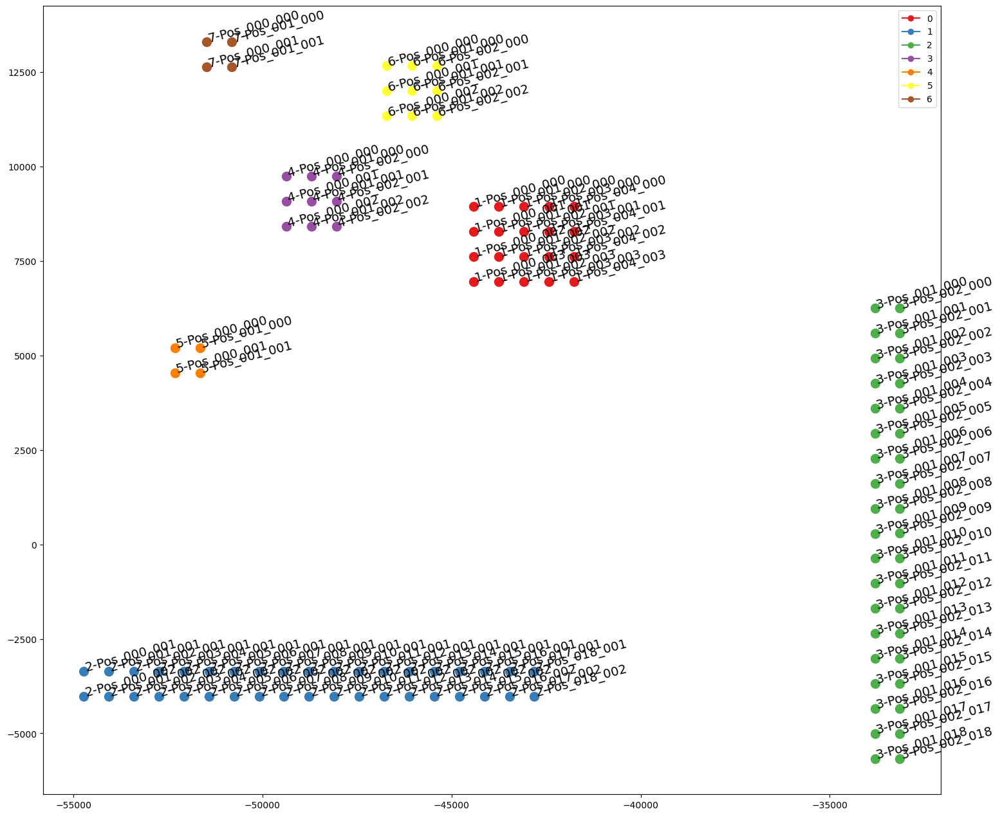

In [38]:
plot_positions(acq.cor_pos_df)

In [8]:
load_proc = lambda x : mma.ProcessUnorderedDiff(acq, pad_ind=x, scale=2, sigma=1, sg_width=7, sg_order=3, bg_sigma=16, overwrite=False,bg_option='comb')
procpads = [load_proc(xx) for xx in [0,3,4,5]]
_ = [procpad._load_arrs(False) for procpad in procpads]

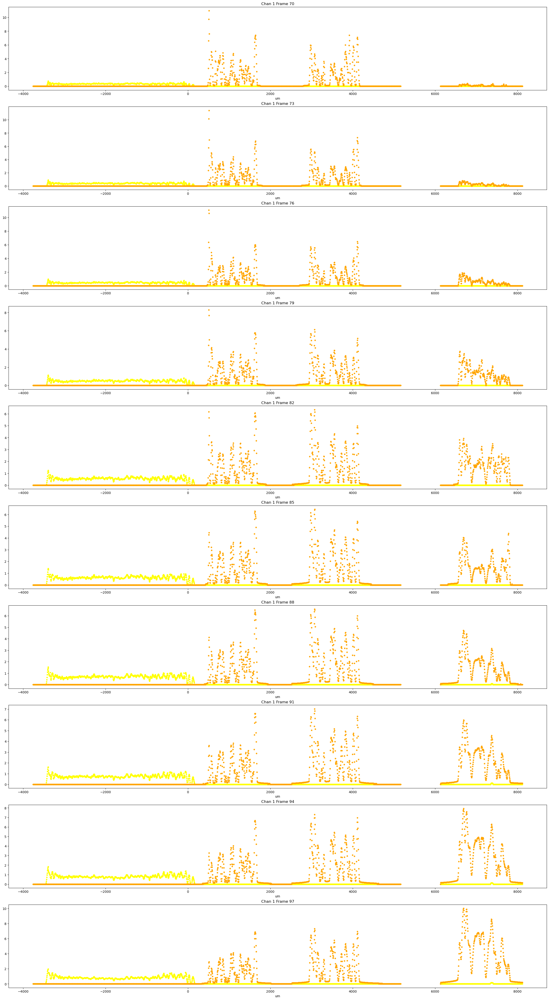

In [57]:
# import downsampled movie
# pad_procs = [procpad1, procpad2]
# pad_styles = ['dashed', 'solid']
pad_styles = ['.']*len(procpads)
offset_vals = [-4.42e4]*5
rot_vals = [0, 0,0,0,0]
np_slices = np.s_[:,:], np.s_[:,:], np.s_[:,:], np.s_[:,:], np.s_[:,:]
chan_vals = [0,1]#,2]
col_vals = ['yellow','orange','blue']
# max_vals = [10000,5000,10000]
max_vals = [1e4,500,200]
# max_vals = [100,30,130]
frame_vals = np.arange(70,100,3)
fig, axs = plt.subplots(len(frame_vals),1,figsize=(30,55))
gb_pad = acq.cor_pos_df.groupby('pad')
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, procpads):
    pixel_size = procpad.pad_helper.pixel_size
    pad_df = gb_pad.get_group(procpad.pad_ind)
    x_min = pad_df.x.min()
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=1] = 0
            xvec = -1*(pixel_size*np.arange(len(plot_vec))+x_min-x_off)
            plot_vec = plot_vec/max_val
            axs[fi].plot(xvec, plot_vec,c=c,linestyle='none',ms=7,marker=ls)
            axs[fi].set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
            axs[fi].set_xlabel('um')

chan:1 pad:2 fit:[ 1.21104263 -3.9116737 ]


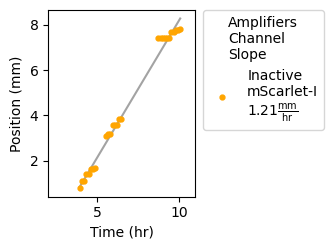

In [58]:
# # import downsampled movie
# pad_vals = [2,3]
# # pad_styles = ['dashed', 'solid']
# pad_styles = ['.', '+']
offset_vals = [-4.42e4]*5
# rot_vals = [2.8, 5,2]
# chan_vals = [0,1]#,2]
# col_vals = ['yellow','red','cyan']
# np_slices = np.s_[250:700,500:3000], np.s_[350:600,500:3000]
# max_vals = [100,25,100]
# max_vals = [1e4,1e4,3e4]
ys = []
cs = []
ts = []
ps = []
dirs = []
col_vals = ['yellow','orange','blue']
frame_vals = np.arange(1,99,1)
fig, axs = plt.subplots(1,1,figsize=(3.5,2.6))
handles = [None]
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, procpads):
    pixel_size = procpad.pad_helper.pixel_size
    pad_df = gb_pad.get_group(procpad.pad_ind)
    x_min = pad_df.x.min()
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind==0:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=4] = 0
            xvec = -1*(pixel_size*np.arange(len(plot_vec))+x_min-x_off)
            plot_vec = plot_vec/max_val
            t_val = acq.time_df.loc[(frame_ind, pad_ind),'time']/3600
            if procpad.pad_ind==5 and t_val > 5:
                continue
            if procpad.pad_ind==3 and t_val > 6.5:
                continue
            if procpad.pad_ind==4 and t_val > 10.2:
                continue
            if np.any(plot_vec>0.1):
                y_val = np.max(xvec[plot_vec>0.1])/1e3
                h = axs.plot(t_val, y_val,c=c,linestyle='none',ms=7,marker=ls)
                # update lists
                ys.append(y_val)
                ts.append(t_val)
                cs.append(chan_ind)
                ps.append(procpad.pad_ind)
                dirs.append(acq.super_dir)
#                 handles[procpad.pad_ind-1][chan_ind-1] = h[0]
#             axs.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#             axs.set_ylim([0,4])
            axs.set_xlim([2,5.5*2])
#             axs.set_xticks([0,1,2,3])
#             axs[fi].set_xlim([0,2.2e3])
            axs.set_xlabel('Time (hr)')
            axs.set_ylabel('Position (mm)')

def f_fun(t,p):
    a, b = p
    return a*t + b

def res_fun(p, t, y):
    return -1*np.sum(scipy.stats.cauchy.logpdf(f_fun(t,p)-y,scale=0.1))

cols = ['dist','time','channel','fn','pad']
data = [ys, ts, cs, dirs, ps]
fit_df = pd.DataFrame(dict(zip(cols,data)))
labels=['Inactive\nmScarlet-I\n{:0.2f}']
for key, chan_df in fit_df.groupby('channel'):
    chan = key
    y_vec = chan_df.dist.values
    t_vec = chan_df.time.values
    p0 = np.array([1,-0.5])
    out = scipy.optimize.minimize(res_fun, p0, args=(t_vec, y_vec))
    color = col_vals[chan]
    sim_t = np.linspace(t_vec.min(),t_vec.max(),3)
    sim_y = f_fun(sim_t, out.x)
    axs.plot(sim_t, sim_y, 'k-',alpha=0.4,zorder=0)
    label_i = 0
    label = labels[label_i]
    labels[label_i] = label.format(out.x[0])+r'$\frac{\mathrm{mm}}{\mathrm{hr}}$'
    print('chan:{} pad:{} fit:{}'.format(chan, pad, out.x))

axs.legend(handles=h, labels=labels,title='Amplifiers\nChannel\nSlope',
          bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0.)

fig.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200303_propagation.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200303_propagation.pdf',transparent=True)

In [36]:
gb_pad = acq.cor_pos_df.groupby('pad')
x_off = -4.42e4
df_list = []
for procpad in procpads[1:]:
    pixel_size = procpad.pad_helper.pixel_size
    pad_df = gb_pad.get_group(procpad.pad_ind)
    x_min = pad_df.x.min()
    im_lab = skimage.morphology.label(procpad.arr[-1,1,...]>5e3)
    regprop = skimage.measure.regionprops(im_lab)
    area_vec = [xx.area*pixel_size**2 for xx in regprop]
    x_vec = [x_off - x_min - xx.centroid[1]*pixel_size for xx in regprop]
    df = pd.DataFrame({'pos':x_vec,'area':area_vec})
    df['padind'] = procpad.pad_ind
    df_list.append(df)
df = pd.concat(df_list,ignore_index=True)


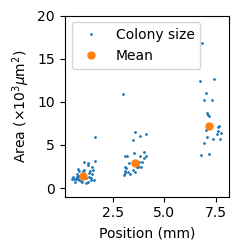

In [65]:
plt.figure(figsize=(2.5,2.6))
agg_df = df.groupby('padind').agg(np.median).reset_index()
agg_df = agg_df.sort_values(by='pos')
plt.plot(df.pos/1e3, df.area/1e3, '.',ms=2)
plt.plot(agg_df.pos/1e3, agg_df.area/1e3, 'o',lw=4,ms=5)
plt.ylim([-1,20])
plt.xlabel('Position (mm)')
plt.ylabel(r'Area ($ \times 10^3\mu$m$^2$)')
plt.legend(['Colony size','Mean'])
plt.tight_layout()
plt.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200303_colonysize.png',transparent=True)
plt.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200303_colonysize.pdf',transparent=True)

In [157]:
fn_list = [ii for ii, xx in enumerate(exp_dirs) if '200213' in xx]
print(fn_list)

[44, 45]


In [159]:
fn_list = [xx for xx in exp_dirs if '200213' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/200213_cin_tests/bf_initial_1', '/groups/murray-biocircuits/jparkin/movies/200213_cin_tests/img_1']


In [160]:
acq = mma.Acquisition(fn_list[1])

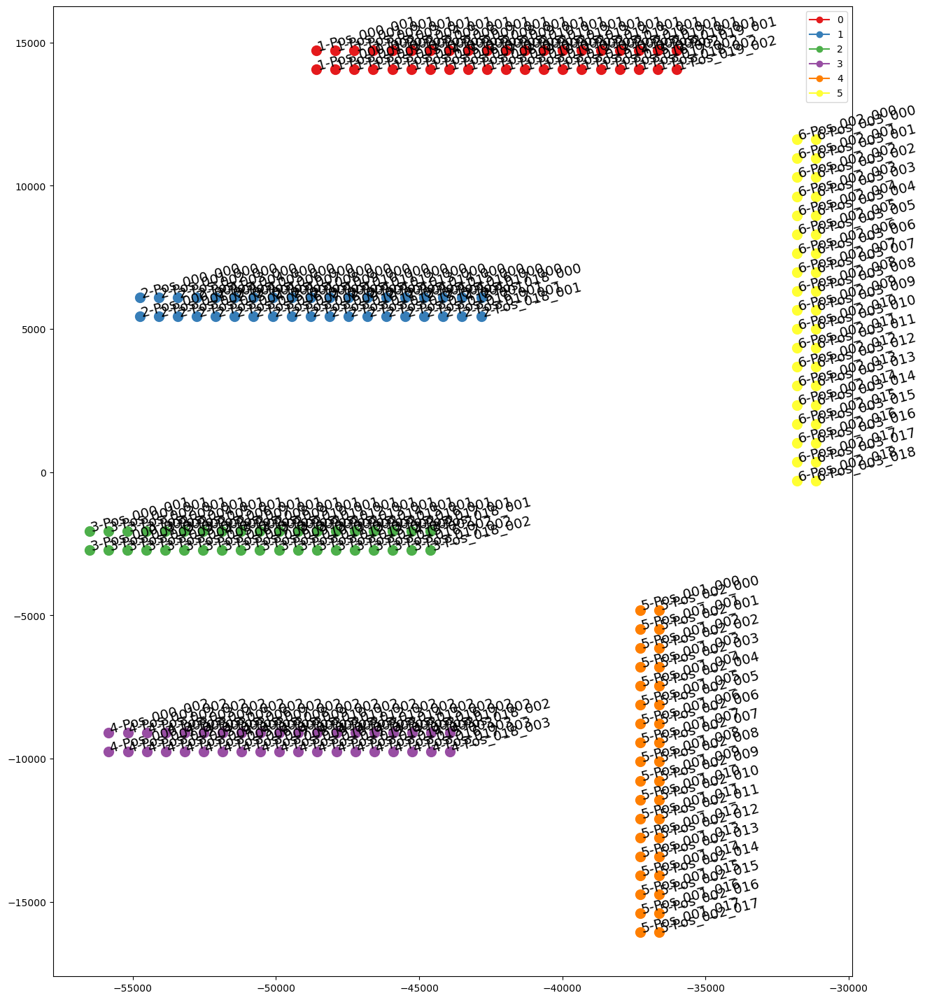

In [96]:
plot_positions(acq.cor_pos_df)

In [161]:
load_proc = lambda x : mma.ProcessUnorderedDiff(acq, pad_ind=x, scale=4, sigma=1, sg_width=7, sg_order=1, bg_sigma=16, overwrite=False,bg_option='comb')
procpads = [load_proc(xx) for xx in np.arange(6)]
for procpad in procpads:
    try:
        tiff_fn = procpad.scr_tmpl.format('',procpad.pad_ind,'')
        arr = procpad.load_tiffstack(tiff_fn,memmap=True)
        procpad.arr = arr
    except Exception as e:
        print(e)
        continue
# _ = [procpad._load_arrs(False) for procpad in procpads]

([], <a list of 0 Text major ticklabel objects>)

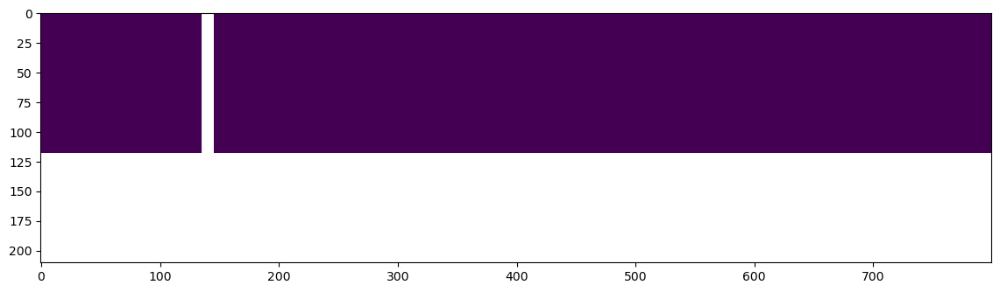

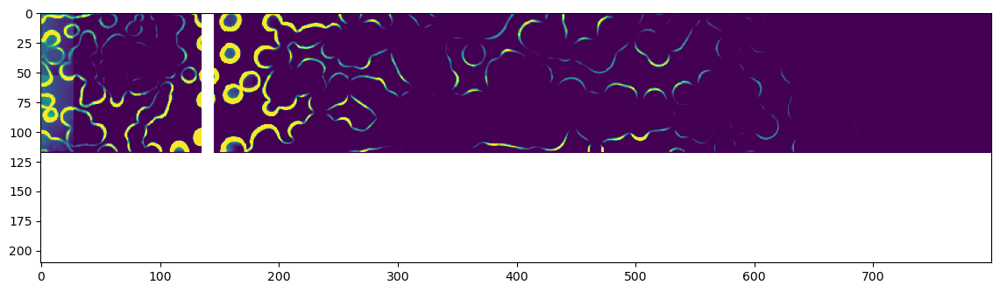

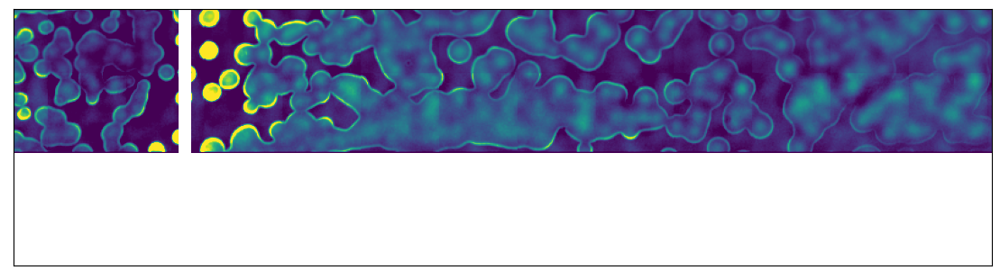

In [162]:
pixel_size = procpads[0].pad_helper.pixel_size
pad_styles = ['.']*len(procpads)
offset_vals = [170*pixel_size,90*pixel_size,140*pixel_size,75*pixel_size,175*pixel_size,175*pixel_size]
rot_vals = [0, 0,0,180,90,90]
np_slices = np.s_[:,120:900], np.s_[:,50:1100], np.s_[75:,100:900], np.s_[:,140:900], np.s_[:,:900], np.s_[:,:900]
chan_vals = [0,1,2]
col_vals = ['black','orange','blue']
# max_vals = [10000,5000,10000]
max_vals = [1e4,6e4,2e4]

plt.figure(figsize=(14,9))
padind=2
frame = 26
_ = plt.imshow(skimage.transform.rotate(procpads[padind].arr[frame,0,:,:].copy(),rot_vals[padind],resize=True)[np_slices[padind]],vmin=max_vals[0]/10,vmax=max_vals[0])
_ = plt.vlines(offset_vals[padind]/pixel_size,0,200,lw=10,color='white')
plt.figure(figsize=(14,9))
_ = plt.imshow(skimage.transform.rotate(procpads[padind].arr[frame,1,:,:].copy(),rot_vals[padind],resize=True)[np_slices[padind]],vmin=max_vals[1]/10/10,vmax=max_vals[1]/10)
_ = plt.vlines(offset_vals[padind]/pixel_size,0,200,lw=10,color='white')
plt.figure(figsize=(14,9))
_ = plt.imshow(skimage.transform.rotate(procpads[padind].arr[frame,2,:,:].copy(),rot_vals[padind],resize=True)[np_slices[padind]],vmin=max_vals[2]/10/10,vmax=max_vals[2]/10)
_ = plt.vlines(offset_vals[padind]/pixel_size,0,200,lw=10,color='white')
plt.xticks([])
plt.yticks([])

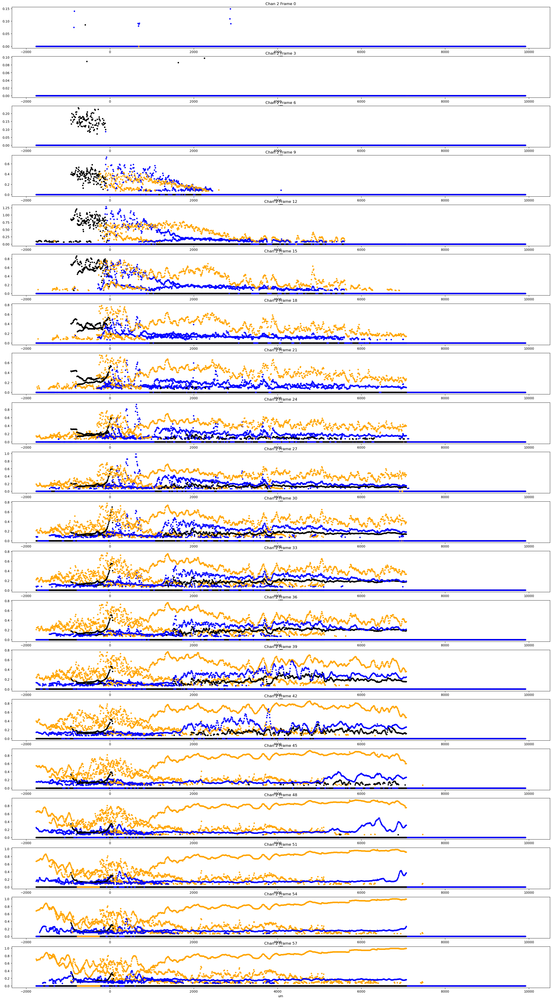

In [163]:
# import downsampled movie
# pad_procs = [procpad1, procpad2]
# pad_styles = ['dashed', 'solid']
# max_vals = [100,30,130]
frame_vals = np.arange(0,60,3)
fig, axs = plt.subplots(len(frame_vals),1,figsize=(30,55))
gb_pad = acq.cor_pos_df.groupby('pad')
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, procpads[:4]):
    pixel_size = procpad.pad_helper.pixel_size
    pad_df = gb_pad.get_group(procpad.pad_ind)
    x_min = pad_df.x.min()
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val,resize=True)[np_sl]
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=1] = 0
            xvec = (pixel_size*np.arange(len(plot_vec))-x_off)
            plot_vec = plot_vec/max_val
            axs[fi].plot(xvec, plot_vec,c=c,linestyle='none',ms=7,marker=ls)
            axs[fi].set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
            axs[fi].set_xlabel('um')

chan:1 pad:2 fit:[ 0.83838343 -8.08984475  5.10020499]
chan:1 pad:3 fit:[ 1.70224007 -5.83291507  7.02189399]
chan:2 pad:2 fit:[ 0.48969652 -5.40919378  3.09165998]
chan:2 pad:3 fit:[0.63754348 0.26853268 7.07256003]


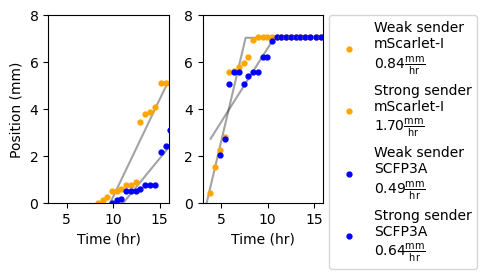

In [174]:
# # import downsampled movie
# pad_vals = [2,3]
# # pad_styles = ['dashed', 'solid']
# pad_styles = ['.', '+']
# rot_vals = [2.8, 5,2]
# chan_vals = [0,1]#,2]
# col_vals = ['yellow','red','cyan']
# np_slices = np.s_[250:700,500:3000], np.s_[350:600,500:3000]
# max_vals = [100,25,100]
# max_vals = [1e4,1e4,3e4]
ys = []
cs = []
ts = []
ps = []
dirs = []
col_vals = ['yellow','orange','blue']
frame_vals = np.arange(0,35,1)
fig, axs_vec = plt.subplots(1,2,figsize=(5,2.7))
handles = [None,None]
proc_ind_dict = dict(zip([xx.pad_ind for xx in procpads],[ii for ii in np.arange(len(procpads))]))
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices[2:4], offset_vals[2:4], pad_styles,rot_vals[2:4], procpads[2:4]):
    pixel_size = procpad.pad_helper.pixel_size
    pad_df = gb_pad.get_group(procpad.pad_ind)
    x_min = pad_df.x.min()
    axs = axs_vec[proc_ind_dict[procpad.pad_ind-2]]
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind==0:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=3] = 0
            xvec = (pixel_size*np.arange(len(plot_vec))-x_off)
#             if procpad.pad_ind==1:
#                 plot_vec[xvec>2e3]=0
#                 print(max_val)
            plot_vec = plot_vec/max_val
            t_val = acq.time_df.loc[(frame_ind, procpad.pad_ind),'time']/3600
            if np.any(plot_vec>0.1):
                y_val = np.max(xvec[plot_vec>0.1])/1e3
                h = axs.plot(t_val, y_val,c=c,linestyle='none',ms=7,marker=ls)
                handles[chan_ind-1] = h[0]
                # update lists
                ys.append(y_val)
                ts.append(t_val)
                cs.append(chan_ind)
                ps.append(procpad.pad_ind)
                dirs.append(acq.super_dir)
#             axs.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
            axs.set_ylim([0,8])
            axs.set_xlim([3,16])
#             axs.set_xticks([0,1,2,3])
#             axs[fi].set_xlim([0,2.2e3])
            axs.set_xlabel('Time (hr)')
#             axs.set_ylabel('Position (mm)')
axs_vec[0].set_ylabel('Position (mm)')

def f_fun(t,p):
    a, b, c = p
    return np.array([np.min([c,xx]) for xx in (a*t + b)])

def res_fun(p, t, y):
    return -1*np.sum(scipy.stats.norm.logpdf(f_fun(t,p)-y,scale=0.3))

cols = ['dist','time','channel','fn','pad']
data = [ys, ts, cs, dirs, ps]
fit_df = pd.DataFrame(dict(zip(cols,data)))
label_tmpls=['Weak sender\nmScarlet-I\n{:0.2f}',
        'Weak sender\nSCFP3A\n{:0.2f}',
        'Strong sender\nmScarlet-I\n{:0.2f}',
        'Strong sender\nSCFP3A\n{:0.2f}']
labels = []
leg_handles = []
fit_df = fit_df.loc[fit_df.dist>0,:]
for key, chan_df in fit_df.groupby(['channel','pad']):
    chan, pad = key
    axs = axs_vec[pad-2]
    chan_df = chan_df.copy()
#     chan_df['dist'] = 0.1*(chan_df['dist'].values//0.1)
#     chan_df = chan_df[['dist','time']].groupby('dist').agg(np.min).reset_index()
    y_vec = chan_df.dist.values
    t_vec = chan_df.time.values
    p0 = np.array([1,-10,np.max(y_vec)])
    out = scipy.optimize.minimize(res_fun, p0, args=(t_vec, y_vec))
    if out.x[0]>0.1:
        color = col_vals[chan]
        sim_t = np.linspace(t_vec.min()-1,t_vec.max(),300)
        sim_y = f_fun(sim_t, out.x)
        axs.plot(sim_t, sim_y, 'k-',alpha=0.4,zorder=0)
        label_i = (chan-1)+2*np.int(np.mod(pad,2))
        label = label_tmpls[label_i]
        labels.append(label.format(out.x[0])+r'$\frac{\mathrm{mm}}{\mathrm{hr}}$')
        leg_handles.append(handles[chan-1])
        print('chan:{} pad:{} fit:{}'.format(chan, pad, out.x))
    else:
        label_i = (chan-1)+2*np.int(np.mod(pad,2))
        labels.append(None)
        leg_handles.append(None)

axs = axs_vec[-1]
axs.legend(handles=leg_handles, labels=labels,#title='Amplifiers\nChannel\nSlope',
          bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0.)

fig.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200213_propagation.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200213_propagation.pdf',transparent=True)

In [172]:
out_list = []
frame_vals = acq.frame_vec
# frame_vals = np.arange(2,25,1)
for np_sl, x_off, rot_val, procpad in zip(np_slices, offset_vals, rot_vals, procpads[:4]):
    pixel_size = procpad.pad_helper.pixel_size
    start, stop = np_sl[1].start, np_sl[1].stop
    arr_len = skimage.transform.rotate(procpad.arr[0,0,...].copy(),rot_val)[np_sl].shape[1]
    out_arr = np.zeros((3,len(acq.frame_vec), np.abs(arr_len)))
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val)[np_sl]
#             if procpad.pad_ind==2:
#                 frame_img[290:310,950:1000]=0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=5] = 0
            plot_vec = plot_vec/max_val
            out_arr[chan_ind, frame_ind, :] = plot_vec
    out_list.append(out_arr)

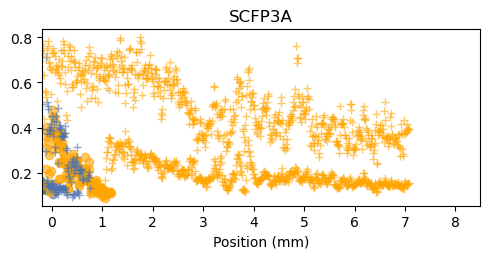

In [155]:
# frame_vals = np.arange(4,15,1)
fig, ax = plt.subplots(1,1,figsize=(5,2.7))
titles = ['mScarlet-I','SCFP3A']
labels = ['Weak Sender-Amplifier','Strong Sender-Amplifier','Weak Sender-Reporter','Strong sender-Reporter']
color_list = ['b','orange','b','orange']
marker_list = ['o','o','+','+']
handles = [None, None,None,None]

for agg_arr, x_off, procpad, c, m, i in zip(out_list, offset_vals, procpads, color_list, marker_list, [0,1,2,3]):
    pixel_size = procpad.pad_helper.pixel_size
    xvec = pixel_size*np.arange(agg_arr.shape[-1])-x_off
    for max_val, chan_ind in zip(max_vals[1:], chan_vals[1:]):
        if chan_ind!=1 and procpad.pad_ind<2:
            continue
        max_vec = np.max(agg_arr[chan_ind,:25,:],axis=0)
        bool_vec = max_vec>0.01
        if np.sum(bool_vec)<31:
            continue
        sub_mx = max_vec[bool_vec]
        sub_xvec = xvec[bool_vec]
#         filt_vec = scipy.signal.savgol_filter(sub_mx, 91,3)
        handles[i] = ax.plot(sub_xvec/1e3, sub_mx,marker=m,c=c,alpha=0.6,linestyle='none')[0]
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c='gray',lw=4.8,zorder=20)
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c=c,lw=2,zorder=80)
        ax.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#         ax.set_ylim([0,1])
        ax.set_xlim([-0.2,np.max(sub_xvec)*1.2e-3])
        ax.set_xlabel('Position (mm)')
        ax.set_title(titles[chan_ind-1])
# ax.legend(handles=handles,labels=labels)
# ax.set_yticks([])
# axs.set_ylabel('Peak fluorescence (a.u.)')
plt.tight_layout()
# fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200213_amplitude.png')
# fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200213_amplitude.pdf')

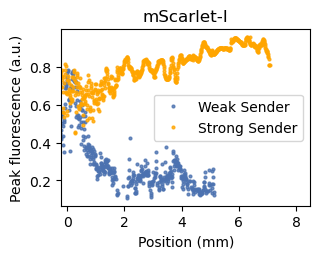

In [173]:
# frame_vals = np.arange(4,15,1)
fig, ax = plt.subplots(1,1,figsize=(3.3,2.7))
titles = ['mScarlet-I','SCFP3A']
labels = ['Weak Sender-Amplifier','Strong Sender-Amplifier','Weak Sender-Reporter','Strong sender-Reporter']
color_list = ['b','orange','b','orange']
marker_list = ['o','o','o','o']
handles = []

for agg_arr, x_off, procpad, c, m, i in zip(out_list, offset_vals, procpads, color_list, marker_list, [0,1,2,3]):
    if procpad.pad_ind<2:
        continue
    pixel_size = procpad.pad_helper.pixel_size
    xvec = pixel_size*np.arange(agg_arr.shape[-1])-x_off
    for max_val, chan_ind in zip(max_vals[1:], chan_vals[1:]):
        if chan_ind!=1:
            continue
        max_vec = np.max(agg_arr[chan_ind,:50,:],axis=0)
        bool_vec = max_vec>0.01
        if np.sum(bool_vec)<31:
            continue
        sub_mx = max_vec[bool_vec]
        sub_xvec = xvec[bool_vec]
#         filt_vec = scipy.signal.savgol_filter(sub_mx, 91,3)
        h = ax.plot(sub_xvec/1e3, sub_mx,marker=m,c=c,alpha=0.8,linestyle='none',ms=2)[0]
        handles.append(h)
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c='gray',lw=4.8,zorder=20)
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c=c,lw=2,zorder=80)
        ax.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#         ax.set_ylim([0,1])
        ax.set_xlim([-0.2,np.max(sub_xvec)*1.2e-3])
        ax.set_xlabel('Position (mm)')
        ax.set_title(titles[chan_ind-1])
ax.legend(handles=handles,labels=['Weak Sender','Strong Sender'])
# ax.set_ylabel('Pea')
ax.set_ylabel('Peak fluorescence (a.u.)')
plt.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200213_amplitude.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/200213_amplitude.pdf',transparent=True)

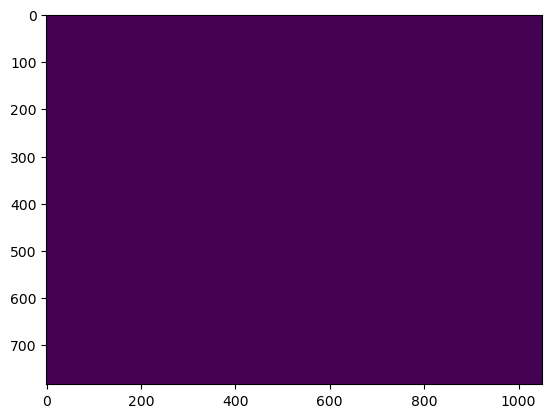

In [146]:
plt.imshow(frame_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

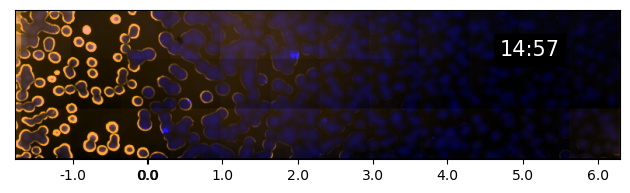

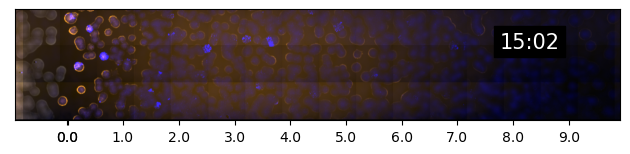

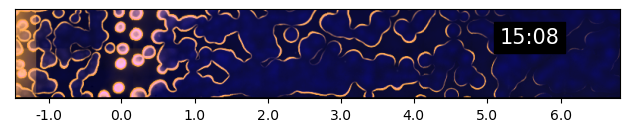

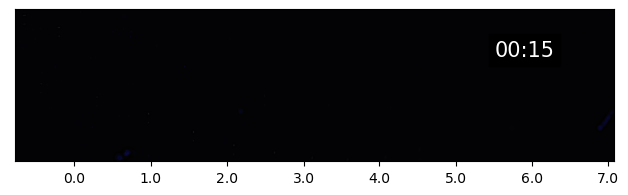

In [84]:
def setup_plot(padproc, x_off, rot_val, np_sl):
    fig, axs = plt.subplots(1,1)
    tmp_arr = skimage.transform.rotate(padproc.arr[0,0,...].copy(),rot_val)[np_sl]
    nh, nw = tmp_arr.shape
    pad_arr = np.zeros((nh, nw, 3))
    h_img = axs.imshow(pad_arr)
    h_txt = axs.text(nw*0.9,2*nh/10,'00:00',fontsize=15,color='white',
                     backgroundcolor='black',horizontalalignment='right',
                    verticalalignment='top')
    ps = padproc.pad_helper.pixel_size
    xvec = ps*np.arange(nw)-x_off
    min_ind = np.arange(nw)[np.abs(xvec)==np.min(np.abs(xvec))]
    hun_ind = np.arange(nw)[np.abs(xvec-1e3)==np.min(np.abs(xvec-1e3))]
    x_step = np.int(min_ind//2)
    xticks = np.array([ii for ii, xx in enumerate(xvec) if (xx%1e3)<=ps])
    xticklabels = xvec[xticks]
    axs.set_xticks(xticks)
    axs.set_xticklabels(['{:0.1f}'.format(xx/1e3) for xx in xticklabels])
    axs.set_yticks([])
    fig.tight_layout()
    return fig, axs, h_img, h_txt

def animate_frame(padproc, x_off, rot_val, np_sl, frame, h_img, h_txt):
    tmp_arr = skimage.transform.rotate(padproc.arr[0,0,...].copy(),rot_val)[np_sl]
    nh, nw = tmp_arr.shape
    img_arr = np.zeros((nh, nw, 3))
    norm_fns = []
    colors_v = ['gray','orange','blue']
    for ci in np.arange(3):
        vmin = np.quantile(padproc.arr[0:35:5,ci,...],0.3)
        vmax = np.quantile(padproc.arr[0:35:5,ci,...],0.9)*4
        vmax = np.max([5e3,vmax])
        norm_fn = mpl_colors.Normalize(vmin, vmax, clip=True)
        norm_fns.append(norm_fn)
        pad_arr = skimage.transform.rotate(padproc.arr[frame,ci,...].copy(),rot_val)[np_sl]
        norm_arr = norm_fn(pad_arr)
        c_vec = mpl_colors.to_rgb(colors_v[ci])
        for img_ci in np.arange(3):
            img_arr[:,:,img_ci] += c_vec[img_ci]*norm_arr
    h_img.set_array(img_arr)
    tval = padproc.acq.time_df.loc[(frame,padproc.pad_ind),'time']
    hrs, mins = np.int(tval//3600), np.int((tval%3600)//60)
    h_txt.set_text('{:02d}:{:02d}'.format(hrs,mins))

pad_ind = 2
for pad_ind in np.arange(4):
    np_sl = np_slices[pad_ind]
    frame=9
    padproc, x_off, rot_val, = procpads[pad_ind], offset_vals[pad_ind], rot_vals[pad_ind]
    np_sl, frame = np_slices[pad_ind], 12
    fig, axs, h_arr, h_txt = setup_plot(padproc, x_off, rot_val, np_sl)
    # animate_frame(padproc, x_off, rot_val, np_sl, frame, h_arr, h_txt)
    frame_vec = np.arange(30)
    # fig, axs, h = setup_plot(padproc, x_off, rot_val, np_sl)
    anim_lamb = lambda frame : animate_frame(padproc, x_off, rot_val, np_sl, frame, h_arr,h_txt)
    anim = anm.FuncAnimation(fig, anim_lamb, interval=100, frames=frame_vec)
    out_fn = 'anims/defanims/{}_pad{}.gif'.format('200213',pad_ind)
    anim.save(out_fn, dpi=80,fps=3,writer='pillow',savefig_kwargs={'transparent': True, 'facecolor': 'none'})



# fig, ax = plt.subplots(1,1)


In [90]:
fn_list = [xx for xx in exp_dirs if '200626' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/200626_finalday/img_1']


In [99]:
acq = mma.Acquisition(fn_list[0])

In [116]:
padproc = mma.ProcessUnorderedDiff(acq, pad_ind=20, scale=1,sigma=2,bg_sigma=32,sg_width=9,sg_order=1,bg_option='comb',overwrite=False)

In [117]:
padproc._load_arrs(False)

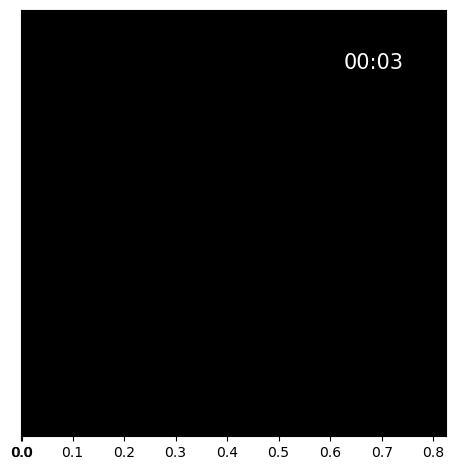

In [132]:
def setup_plot(padproc, x_off, rot_val, np_sl):
    fig, axs = plt.subplots(1,1)
    tmp_arr = skimage.transform.rotate(padproc.arr[0,0,...].copy(),rot_val)[np_sl]
    nh, nw = tmp_arr.shape
    pad_arr = np.zeros((nh, nw, 3))
    h_img = axs.imshow(pad_arr)
    h_txt = axs.text(nw*0.9,1*nh/10,'00:00',fontsize=15,color='white',
                     backgroundcolor='black',horizontalalignment='right',
                    verticalalignment='top')
    ps = padproc.pad_helper.pixel_size
    xvec = ps*np.arange(nw)-x_off
    min_ind = np.arange(nw)[np.abs(xvec)==np.min(np.abs(xvec))]
    hun_ind = np.arange(nw)[np.abs(xvec-1e3)==np.min(np.abs(xvec-1e3))]
    x_step = np.int(min_ind//2)
    xticks = np.array([ii for ii, xx in enumerate(xvec) if (xx%1e2)<=ps])
    xticklabels = xvec[xticks]
    axs.set_xticks(xticks)
    axs.set_xticklabels(['{:0.1f}'.format(xx/1e3) for xx in xticklabels])
    axs.set_yticks([])
    fig.tight_layout()
    return fig, axs, h_img, h_txt

def animate_frame(padproc, x_off, rot_val, np_sl, frame, h_img, h_txt):
    tmp_arr = skimage.transform.rotate(padproc.arr[0,0,...].copy(),rot_val)[np_sl]
    nh, nw = tmp_arr.shape
    img_arr = np.zeros((nh, nw, 3))
    norm_fns = []
    colors_v = ['gray','orange','blue']
    for ci in np.arange(3):
        vmin = np.quantile(padproc.arr[40:70:3,ci,...],0.3)
        vmax = np.quantile(padproc.arr[40:70:3,ci,...],0.8)
        vmax = np.max([5e3,vmax])
#         vmin = np.max([5e2,vmax])
        if ci==2:
            vmax = np.max([1e5,vmax])
        norm_fn = mpl_colors.Normalize(vmin, vmax, clip=True)
        norm_fns.append(norm_fn)
        pad_arr = skimage.transform.rotate(padproc.arr[frame,ci,...].copy(),rot_val)[np_sl]
        norm_arr = norm_fn(pad_arr)
        c_vec = mpl_colors.to_rgb(colors_v[ci])
        for img_ci in np.arange(3):
            img_arr[:,:,img_ci] += c_vec[img_ci]*norm_arr
    h_img.set_array(img_arr)
    tval = padproc.acq.time_df.loc[(frame,padproc.pad_ind),'time']
    hrs, mins = np.int(tval//3600), np.int((tval%3600)//60)
    h_txt.set_text('{:02d}:{:02d}'.format(hrs,mins))

np_sl = np.s_[:,:]
rot_vals = {'7':0}
frame=9
fig, axs, h_arr, h_txt = setup_plot(padproc, x_off, rot_val, np_sl)
# animate_frame(padproc, x_off, rot_val, np_sl, frame, h_arr, h_txt)
frame_vec = acq.frame_vec
# fig, axs, h = setup_plot(padproc, x_off, rot_val, np_sl)
anim_lamb = lambda frame : animate_frame(padproc, x_off, rot_val, np_sl, frame, h_arr,h_txt)
anim = anm.FuncAnimation(fig, anim_lamb, interval=100, frames=frame_vec)
out_fn = 'anims/defanims/{}_pad{}.gif'.format('200626',padproc.pad_ind)
anim.save(out_fn, dpi=80,fps=6,writer='pillow',savefig_kwargs={'transparent': True, 'facecolor': 'none'})



# fig, ax = plt.subplots(1,1)


In [124]:
padproc.pad_ind

20

In [133]:
fn_list = [xx for xx in exp_dirs if '200303_sender_receiver' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/200303_sender_receiver/final_overview_1', '/groups/murray-biocircuits/jparkin/movies/200303_sender_receiver/final_overview_2', '/groups/murray-biocircuits/jparkin/movies/200303_sender_receiver/final_overview_bf_1', '/groups/murray-biocircuits/jparkin/movies/200303_sender_receiver/img_1', '/groups/murray-biocircuits/jparkin/movies/200303_sender_receiver/img_2']


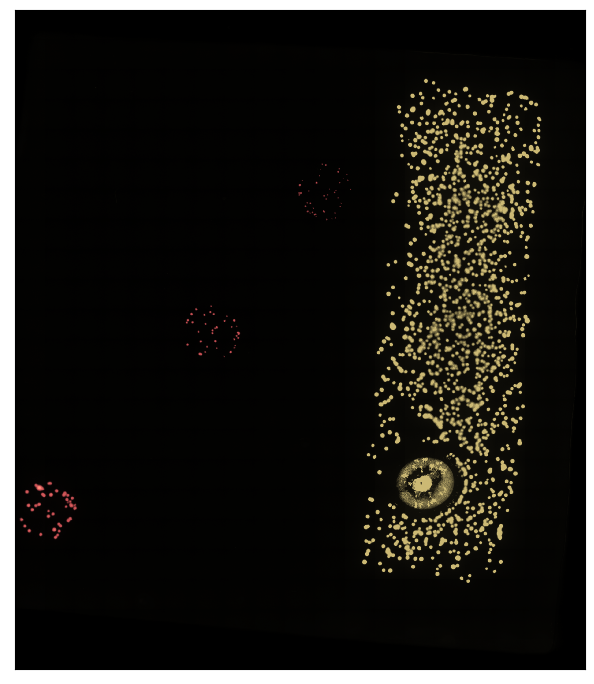

In [134]:
acq = mma.Acquisition(fn_list[1])
pad_helper = mma.WriteHelper(acq, scale=2)
pad_helper.setup_plot()
pad_helper.animate(0)

In [138]:
fn_list = [xx for xx in exp_dirs if '190222' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/190222_pfb_test/20190222_1']


In [146]:
acq = mma.Acquisition(fn_list[0])
out_tmpl = 'anims/defanims/{}_pad{}.gif'
for pad_ind in [7,8,9,10]:
    out_fn = out_tmpl.format('190222',pad_ind)
    pad_helper = mma.WriteHelper(acq, pad_ind=pad_ind, scale=2)
    pad_helper.save_anim(out_fn, writer='pillow')

Image not found when printing 190222_pfb_test: pad:8.0 frame:8 pos:59 channel:3
Image not found when printing 190222_pfb_test: pad:8.0 frame:15 pos:58 channel:5
Image not found when printing 190222_pfb_test: pad:9.0 frame:3 pos:114 channel:0
Image not found when printing 190222_pfb_test: pad:10.0 frame:15 pos:6 channel:0


In [145]:
acq.chan_ind_list

[0, 3, 5]

In [260]:
fn_list = [xx for xx in exp_dirs if '180601' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/180601/180601_1']


In [261]:
acq = mma.Acquisition(fn_list[0])
acq.pixel_size
# out_tmpl = 'anims/defanims/{}_pad{}.gif'
# for pad_ind in [7,8,9,10]:
#     out_fn = out_tmpl.format('190222',pad_ind)
#     pad_helper = mma.WriteHelper(acq, pad_ind=pad_ind, scale=2)
#     pad_helper.save_anim(out_fn, writer='pillow')

0.8078124999999999

In [68]:
fn_list = [xx for xx in exp_dirs if '190316' in xx]
print(fn_list)

['/groups/murray-biocircuits/jparkin/movies/190316/20190316_2']


In [69]:
acq = mma.Acquisition(fn_list[0])
np.unique(acq.cor_pos_df['pad'].values)
# out_tmpl = 'anims/defanims/{}_pad{}.gif'
# for pad_ind in [7,8,9,10]:
#     out_fn = out_tmpl.format('190222',pad_ind)
#     pad_helper = mma.WriteHelper(acq, pad_ind=pad_ind, scale=2)
#     pad_helper.save_anim(out_fn, writer='pillow')

array([0., 1., 2., 3.])

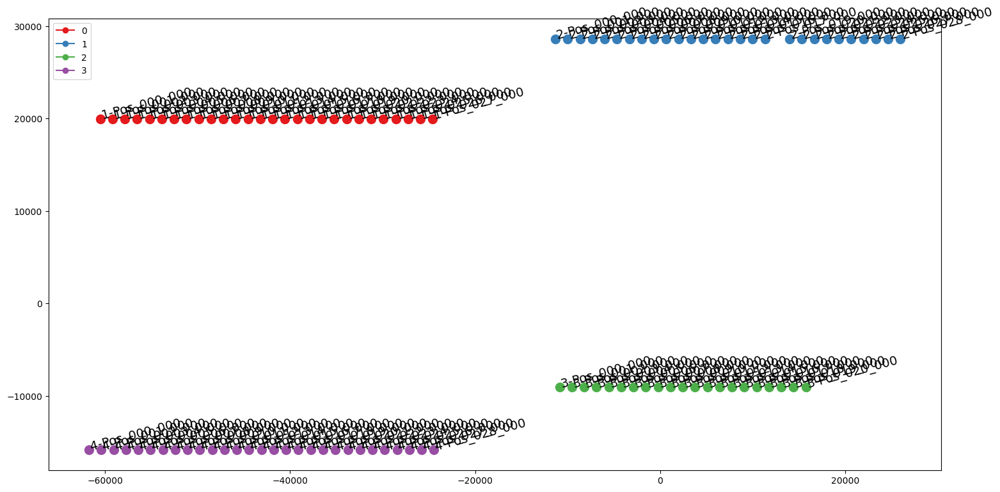

In [72]:
plot_positions(acq.cor_pos_df)

In [73]:
load_proc = lambda x : mma.ProcessUnorderedDiff(acq, pad_ind=x, scale=2, sigma=1, sg_width=7, sg_order=1, bg_sigma=16, overwrite=False,bg_option='comb')
procpads = [load_proc(xx) for xx in np.arange(4)]
for procpad in procpads:
    try:
        tiff_fn = procpad.scr_tmpl.format('',procpad.pad_ind,'')
        arr = procpad.load_tiffstack(tiff_fn,memmap=True)
        procpad.arr = arr
    except Exception as e:
        print(e)
        continue
# _ = [procpad._load_arrs(False) for procpad in procpads]

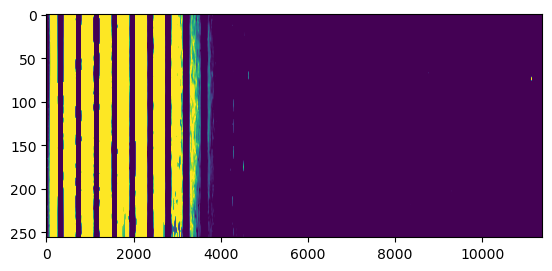

In [175]:
plt.imshow(procpads[0].arr[18,1,...],vmin=400,vmax=4e3,aspect=20)

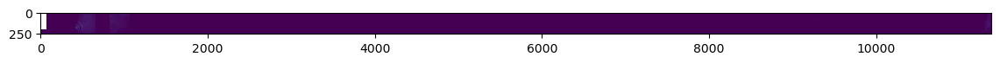

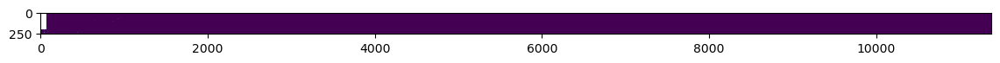

In [74]:
pixel_size = procpads[0].pad_helper.pixel_size
n_pads = len(procpads)
pad_styles = ['.']*len(procpads)
offset_vals = [0]*n_pads#[170*pixel_size,90*pixel_size,140*pixel_size,75*pixel_size,175*pixel_size,175*pixel_size]
rot_vals = [0, 0,0,0]
np_slices = np.s_[:,:], np.s_[:,:], np.s_[:,:], np.s_[:,:]
chan_vals = [0,1]
col_vals = ['black','cyan']
# max_vals = [10000,5000,10000]
max_vals = [8e4,4e5]

plt.figure(figsize=(14,9))
padind=0
frame = 4
arr = skimage.transform.rotate(procpads[padind].arr[frame,0,:,:].copy(),rot_vals[padind],resize=True)[np_slices[padind]]
_ = plt.imshow(skimage.transform.rotate(procpads[padind].arr[frame,0,:,:].copy(),rot_vals[padind],resize=True)[np_slices[padind]],vmin=max_vals[0]/10,vmax=max_vals[0])
_ = plt.vlines(offset_vals[padind]/pixel_size,0,200,lw=10,color='white')
fig = plt.figure(figsize=(14,9))
_ = plt.imshow(skimage.transform.rotate(procpads[padind].arr[frame,1,:,:].copy(),rot_vals[padind],resize=True)[np_slices[padind]],vmin=max_vals[1]/10/10,vmax=max_vals[1]/10)
_ = plt.vlines(offset_vals[padind]/pixel_size,0,200,lw=10,color='white')

# plt.gca().set_xticks([np.linspace(0,arr.shape[1],20)])
# plt.tight_layout()
# plt.xticklabels(['{:0.1f}'.format(xx/1e3) for xx in np.linspace(0,arr.shape[1],20)*pixel_size])
# plt.yticks([])

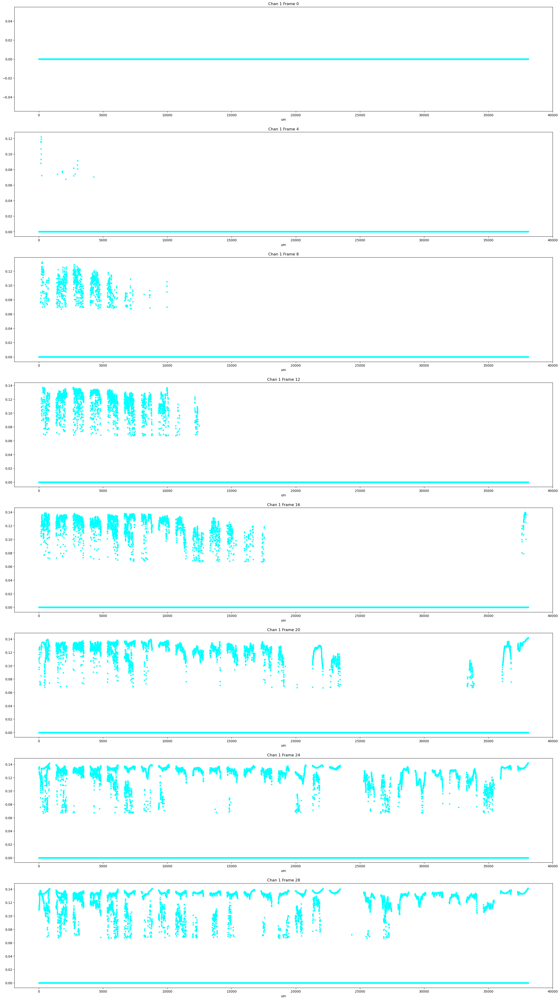

In [75]:
# import downsampled movie
# pad_procs = [procpad1, procpad2]
# pad_styles = ['dashed', 'solid']
# max_vals = [100,30,130]
frame_vals = acq.frame_vec[::4]
fig, axs = plt.subplots(len(frame_vals),1,figsize=(30,55))
gb_pad = acq.cor_pos_df.groupby('pad')
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, procpads[:4]):
    pixel_size = procpad.pad_helper.pixel_size
    pad_df = gb_pad.get_group(procpad.pad_ind)
    x_min = pad_df.x.min()
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind ==0:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val,resize=True)[np_sl]
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=1] = 0
            xvec = (pixel_size*np.arange(len(plot_vec))-x_off)
            plot_vec = plot_vec/max_val
            axs[fi].plot(xvec, plot_vec,c=c,linestyle='none',ms=7,marker=ls)
            axs[fi].set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
            axs[fi].set_xlabel('um')

chan:1 pad:0 fit:[ 3.95392625 -4.10447794  8.19081484]
chan:1 pad:1 fit:[ 4.64338932 -8.73095634 28.79249817]


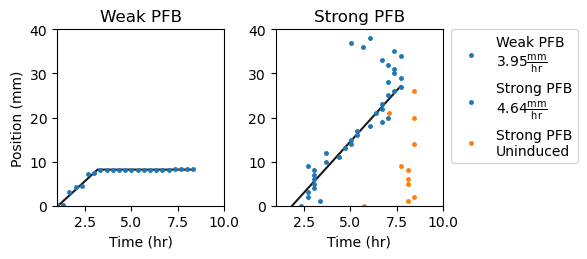

In [94]:
# # import downsampled movie
# pad_vals = [2,3]
# # pad_styles = ['dashed', 'solid']
# pad_styles = ['.', '+']
# rot_vals = [2.8, 5,2]
# chan_vals = [0,1]#,2]
# col_vals = ['yellow','red','cyan']
# np_slices = np.s_[250:700,500:3000], np.s_[350:600,500:3000]
# max_vals = [100,25,100]
# max_vals = [1e4,1e4,3e4]
ys = []
cs = []
ts = []
ps = []
dirs = []
col_vals = ['yellow','orange','blue']
frame_vals = acq.frame_vec[:-4]
fig, axs_vec = plt.subplots(1,2,figsize=(6,2.7))
axs_dict = dict(zip([0,1,2,3],[axs_vec[0],axs_vec[1],axs_vec[1],axs_vec[0]]))
handles = [None,None]
proc_ind_dict = dict(zip([xx.pad_ind for xx in procpads],[ii for ii in np.arange(len(procpads))]))
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, procpads):
    pixel_size = procpad.pad_helper.pixel_size
    pad_df = gb_pad.get_group(procpad.pad_ind)
    x_min = pad_df.x.min()
#     axs = axs_vec[proc_ind_dict[procpad.pad_ind-2]]
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            if chan_ind==0:
                continue
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val,resize=True)[np_sl]
            bool_arr = frame_img>(max_val/10)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
#             plot_vec[bool_arr.sum(axis=0)<=3] = 0
            xvec = (pixel_size*np.arange(len(plot_vec))-x_off)
#             if procpad.pad_ind==1:
#                 plot_vec[xvec>2e3]=0
#                 print(max_val)
            plot_vec = plot_vec/max_val
            t_val = acq.time_df.loc[(frame_ind, procpad.pad_ind),'time']/3600
            if np.any(plot_vec>0.1):
                y_val = xvec[plot_vec>0.1]/1e3
                t_val = t_val*np.ones_like(y_val)
#                 h = axs.plot(t_val, y_val,c=c,linestyle='none',ms=7,marker=ls)
#                 handles[chan_ind-1] = h[0]
                # update lists
                ys.append(y_val)
                ts.append(t_val)
                cs.append(chan_ind*np.ones_like(y_val))
                ps.append(procpad.pad_ind*np.ones_like(y_val))
#                 dirs.append(acq.super_dir)
#             axs.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
#             axs.set_ylabel('Position (mm)')
axs_vec[0].set_ylabel('Position (mm)')

def f_fun(t,p):
    a, b, c = p
    return np.array([np.min([c,xx]) for xx in (a*t + b)])

def res_fun(p, t, y):
    return -1*np.sum(scipy.stats.norm.logpdf(f_fun(t,p)-y,scale=0.3))

cols = ['dist','time','channel','pad']
data = [np.hstack(ys), np.hstack(ts), np.hstack(cs),np.hstack(ps)]
fit_df = pd.DataFrame(dict(zip(cols,data)))
titles=['Weak PFB',
        'Strong PFB',
        'Strong PFB\nUninduced',
        'Weak PFB\nUninduced']
label_tmpls=[xx+'\n{:0.2f}' for xx in titles]
labels = []
leg_handles = []
fit_df = fit_df.loc[fit_df.dist>0,:]
fit_df = fit_df.loc[fit_df.channel>0,:]
x_binwidth = 1
for key, chan_df in fit_df.groupby(['channel','pad']):
    chan, pad = key
    pad = np.int(pad)
    chan = np.int(chan)
    axs = axs_dict[pad]
    axs.set_ylim([0,40])
    axs.set_xlim([1,10])
    axs.set_xlabel('Time (hr)')
    chan_df = chan_df.copy()
    if pad==0:
        chan_df = chan_df[['dist','time']].groupby('time').agg(np.max).reset_index()
    else:
        chan_df['dist'] = x_binwidth*(chan_df['dist'].values//x_binwidth)
        chan_df = chan_df[['dist','time']].groupby('dist').agg(np.min).reset_index()
    y_vec = chan_df.dist.values
    t_vec = chan_df.time.values
    h = axs.plot(t_vec, y_vec,'.',ms=5)[0]
    bool_vec = y_vec<30
    y_vec = y_vec[bool_vec]
    t_vec = chan_df.time.values[bool_vec]
    p0 = np.array([1,-10,np.max(y_vec)])
    out = scipy.optimize.minimize(res_fun, p0, args=(t_vec, y_vec))
    if out.x[0]>0.1 and pad<2:
        color = col_vals[chan]
        sim_t = np.linspace(t_vec.min()-1,t_vec.max(),300)
        sim_y = f_fun(sim_t, out.x)
        axs.plot(sim_t, sim_y, 'k-',alpha=1,zorder=0)
        label_i = pad
        label = label_tmpls[label_i]
        labels.append(label.format(out.x[0])+r'$\frac{\mathrm{mm}}{\mathrm{hr}}$')
        leg_handles.append(h)
        print('chan:{} pad:{} fit:{}'.format(chan, pad, out.x))
    else:
        label_i = pad
        label = titles[label_i]
        labels.append(label)
        leg_handles.append(h)
    axs.set_title(titles[pad])
    
axs = axs_vec[0]
axs.set_title(titles[0])
axs = axs_vec[1]
axs.set_title(titles[1])

axs = axs_vec[-1]
axs.legend(handles=leg_handles, labels=labels,#title='Amplifiers\nChannel\nSlope',
          bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0.)

fig.tight_layout()
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/190316_propagation.png',transparent=True)
fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/190316_propagation.pdf',transparent=True)

In [205]:
leg_handles

[[<matplotlib.lines.Line2D at 0x7f8f379b28d0>],
 None]

(400, 3029)


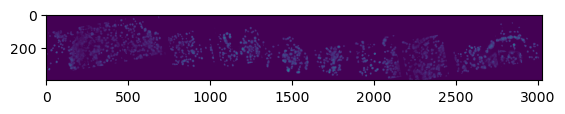

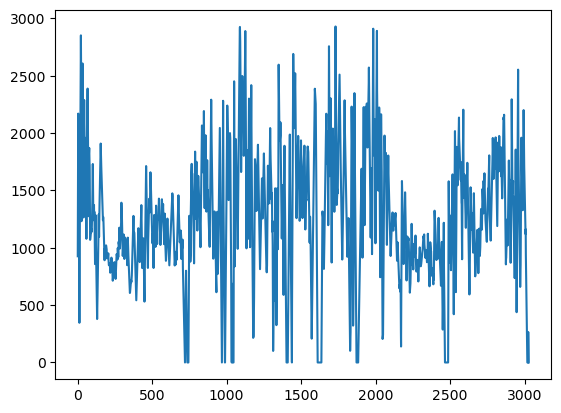

In [88]:

frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
frame_img = skimage.transform.rotate(frame_img, rot_val,resize=True)[np_sl]
bool_arr = frame_img>(max_val/10)
frame_img[False==bool_arr] = 0
print(frame_img.shape)
plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
plot_vec[plot_vec<=0] = 0
plt.imshow(frame_img)
plt.figure()
plt.plot(plot_vec)

In [126]:
out_list = []
# frame_vals = acq.frame_vec
frame_vals = acq.frame_vec[:-4]
for np_sl, x_off, ls, rot_val, procpad in zip(np_slices, offset_vals, pad_styles,rot_vals, procpads):
    pixel_size = procpad.pad_helper.pixel_size
    arr_len = skimage.transform.rotate(procpad.arr[0,0,...].copy(),rot_val,resize=True)[np_sl].shape[1]
    out_arr = np.zeros((2,len(acq.frame_vec), np.abs(arr_len)))
    for fi, frame_ind in enumerate(frame_vals):
        for max_val, c, chan_ind in zip(max_vals, col_vals, chan_vals):
            frame_img = procpad.arr[frame_ind, chan_ind, :, :].copy()
            frame_img = skimage.transform.rotate(frame_img, rot_val,resize=True)[np_sl]
#             if procpad.pad_ind==2:
#                 frame_img[290:310,950:1000]=0
#             frame_img = skimage.filters.gaussian(frame_img, 8, preserve_range=True)
            bool_arr = frame_img>(200)
            frame_img[False==bool_arr] = 0
            plot_vec = frame_img.sum(axis=0) / (bool_arr.sum(axis=0)+1)
            plot_vec[plot_vec<=0] = 0
            plot_vec[bool_arr.sum(axis=0)<=5] = 0
            plot_vec = (plot_vec-200)/(max_val-200)
            out_arr[chan_ind, frame_ind, :] = plot_vec
    out_list.append(out_arr)

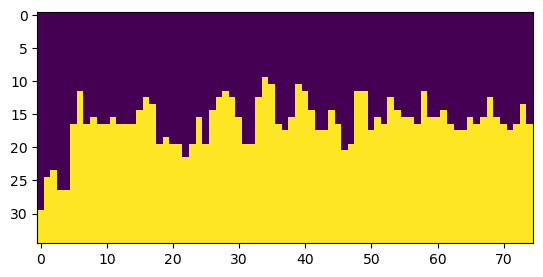

In [159]:
dwn_arr = skimage.transform.downscale_local_mean(out_list[2][1,:35,:],(1,32))
thresh = skimage.filters.threshold_li(dwn_arr)
plt.imshow(dwn_arr>thresh)
# im_bw = dwn_arr>thresh
# y_vec = np.arange(dwn_arr.shape[0]-1)
# y_vals = [y_vec[xx] for xx in list(np.diff(im_bw,axis=0).T)]
# x_vals = [32*procpads[3].pad_helper.pixel_size*xx*np.ones_like(yy) for xx,yy in enumerate(y_vals)]

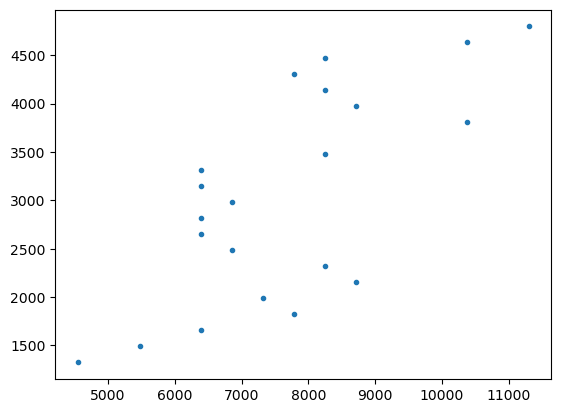

In [152]:
y_vec = np.hstack(y_vals)
x_vec = np.hstack(x_vals)
time_keys = [(yval, 3) for yval in y_vec]
t_vals = acq.time_df.loc[time_keys,'time']
plt.plot(t_vals[8:29],x_vec[8:29],'.')

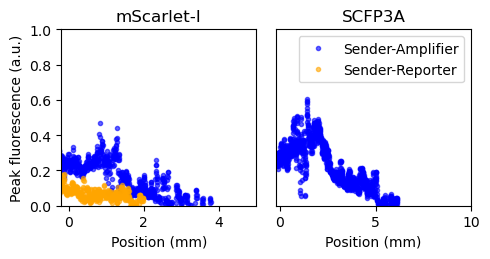

In [190]:
# frame_vals = np.arange(4,15,1)
fig, axs = plt.subplots(1,2,figsize=(5,2.7))
titles = ['mScarlet-I','SCFP3A']
labels = ['Sender-Reporter','Sender-Amplifier'][::-1]
handles = [None, None]
xlim_maxs = [5,10]
for agg_arr, x_off, procpad, c, i in zip(out_list, offset_vals, pad_procs, col_vals[1:][::-1], [0,1]):
    pixel_size = procpad.pad_helper.pixel_size
    xvec = pixel_size*np.arange(agg_arr.shape[-1])-x_off
    for ax, max_val, chan_ind, xmax in zip(axs, max_vals[1:], chan_vals[1:],xlim_maxs):
        if chan_ind==0:
            continue
        max_vec = np.max(agg_arr[chan_ind,:15,:],axis=0)
        bool_vec = max_vec>0
        if np.sum(bool_vec)<31:
            continue
        sub_mx = max_vec[bool_vec]
        sub_xvec = xvec[bool_vec]
        filt_vec = scipy.signal.savgol_filter(sub_mx, 91,3)
        handles[i] = ax.plot(sub_xvec/1e3, sub_mx,'.',c=c,alpha=0.6)[0]
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c='gray',lw=4.8,zorder=20)
#         ax.plot(sub_xvec/1e3, filt_vec,'-',c=c,lw=2,zorder=80)
        ax.set_title("Chan {} Frame {}".format(chan_ind, frame_ind))
        ax.set_ylim([0,1])
        ax.set_xlim([-0.2,xmax])
        ax.set_xlabel('Position (mm)')
        ax.set_title(titles[chan_ind-1])
ax.legend(handles=handles,labels=labels)
ax.set_yticks([])
axs[0].set_ylabel('Peak fluorescence (a.u.)')
plt.tight_layout()
# fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191217_amplitude.png',transparent=True)
# fig.savefig('/home/jparkin/groupdir/biotek/summary-analysis/figures/191217_amplitude.pdf',transparent=True)

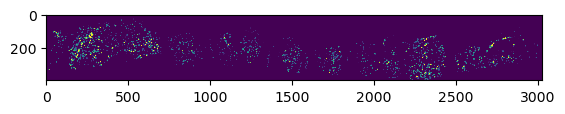

In [70]:
frame_img = procpad.arr[20, chan_ind, :, :].copy()
frame_img = skimage.transform.rotate(frame_img, rot_val,resize=True)[np_sl]
plt.imshow(frame_img,vmin=100,vmax=500)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

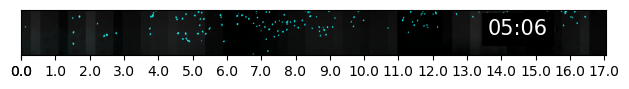

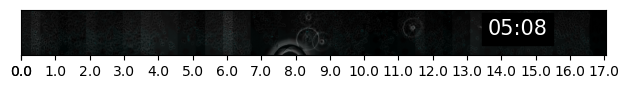

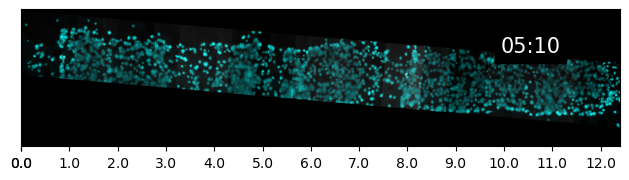

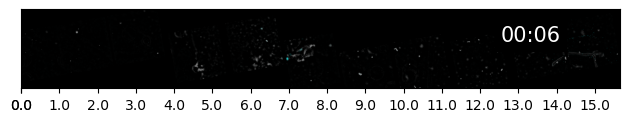

In [146]:
def setup_plot(padproc, x_off, rot_val, np_sl):
    fig, axs = plt.subplots(1,1)
    tmp_arr = skimage.transform.rotate(padproc.arr[0,0,...].copy(),rot_val,resize=True)[np_sl]
    nh, nw = tmp_arr.shape
    pad_arr = np.zeros((nh, nw, 3))
    h_img = axs.imshow(pad_arr)
    h_txt = axs.text(nw*0.9,2*nh/10,'00:00',fontsize=15,color='white',
                     backgroundcolor='black',horizontalalignment='right',
                    verticalalignment='top')
    ps = padproc.pad_helper.pixel_size
    xvec = ps*np.arange(nw)-x_off
    min_ind = np.arange(nw)[np.abs(xvec)==np.min(np.abs(xvec))]
    hun_ind = np.arange(nw)[np.abs(xvec-1e3)==np.min(np.abs(xvec-1e3))]
    x_step = np.int(min_ind//2)
    xticks = np.array([ii for ii, xx in enumerate(xvec) if (xx%1e3)<=ps])
    xticklabels = xvec[xticks]
    axs.set_xticks(xticks)
    axs.set_xticklabels(['{:0.1f}'.format(xx/1e3) for xx in xticklabels])
    axs.set_yticks([])
    fig.tight_layout()
    return fig, axs, h_img, h_txt

def animate_frame(padproc, x_off, rot_val, np_sl, frame, h_img, h_txt):
    tmp_arr = skimage.transform.rotate(padproc.arr[0,0,...].copy(),rot_val,resize=True)[np_sl]
    nh, nw = tmp_arr.shape
    img_arr = np.zeros((nh, nw, 3))
    norm_fns = []
    colors_v = ['gray','cyan','blue']
    for ci in np.arange(2):
        vmin = np.quantile(padproc.arr[20:35,ci,...],0.3)
        vmax = np.quantile(padproc.arr[20:35,ci,...],0.9)*4
        vmax = np.max([5e3,vmax])
        norm_fn = mpl_colors.Normalize(vmin, vmax, clip=True)
        norm_fns.append(norm_fn)
        pad_arr = skimage.transform.rotate(padproc.arr[frame,ci,...].copy(),rot_val,resize=True)[np_sl]
        norm_arr = norm_fn(pad_arr)
        c_vec = mpl_colors.to_rgb(colors_v[ci])
        for img_ci in np.arange(3):
            img_arr[:,:,img_ci] += c_vec[img_ci]*norm_arr
    h_img.set_array(img_arr)
    tval = padproc.acq.time_df.loc[(frame,padproc.pad_ind),'time']
    hrs, mins = np.int(tval//3600), np.int((tval%3600)//60)
    h_txt.set_text('{:02d}:{:02d}'.format(hrs,mins))

pad_ind = 0
np_sl = np_slices[pad_ind]
frame=9
for pad_ind in [0,1,2,3]:
    padproc, x_off, rot_val, = procpads[pad_ind], offset_vals[pad_ind], rot_vals[pad_ind]
    np_sl, frame = np_slices[pad_ind], 12
    fig, axs, h_arr, h_txt = setup_plot(padproc, x_off, rot_val, np_sl)
    # animate_frame(padproc, x_off, rot_val, np_sl, frame, h_arr, h_txt)
    frame_vec = acq.frame_vec[:-4]
    # fig, axs, h = setup_plot(padproc, x_off, rot_val, np_sl)
    anim_lamb = lambda frame : animate_frame(padproc, x_off, rot_val, np_sl, frame, h_arr,h_txt)
    anim = anm.FuncAnimation(fig, anim_lamb, interval=100, frames=frame_vec)
    out_fn = 'anims/defanims/{}_pad{}.gif'.format('190727',pad_ind)
    anim.save(out_fn, dpi=80,fps=3,writer='pillow',savefig_kwargs={'transparent': True, 'facecolor': 'none'})


# fig, ax = plt.subplots(1,1)


# reviewing csvs from 200626

In [9]:
peaks_df = pd.read_csv('../200626_finalday/img_1/csvs/peaks_df.csv')

In [11]:
peaks_df.head()

,Unnamed: 0,Unnamed: 0.1,dist_binned,frame,level,thresh,channel,acqname,time,pad,diff,rad,b_vec,y,co_ct,lam,mdi,l10_cct
0,0,0,256.884375,4.0,0,3.992072,2.0,200626_finalday_img_1,1919.333333,0,True,1.000000,False,18.584450,0.000000,0.000319,2,-inf
1,1,1,75.934375,44.0,0,5.162630,3.0,200626_finalday_img_1,21119.666667,0,True,13.146111,False,6.419590,18.779111,0.000319,2,1.273675
2,2,2,121.171875,43.0,0,5.162630,3.0,200626_finalday_img_1,20639.666667,0,True,12.987144,False,9.668176,33.041298,0.000319,2,1.519057
3,3,3,159.946875,50.0,0,5.162630,3.0,200626_finalday_img_1,23999.666667,0,True,14.238379,False,12.552669,14.686415,0.000319,2,1.166916
4,4,4,218.109375,58.0,0,5.162630,3.0,200626_finalday_img_1,28662.000000,0,True,14.555788,False,16.767027,4.430223,0.000319,2,0.646426


In [12]:
peaks_df[['mdi','lam']].groupby('mdi').agg(np.median)

,lam
mdi,
0,NaN
1,0.000340
2,0.000303
3,NaN
4,0.000231
5,NaN
6,NaN
8,0.000161
9,0.000342


<ErrorbarContainer object of 3 artists>

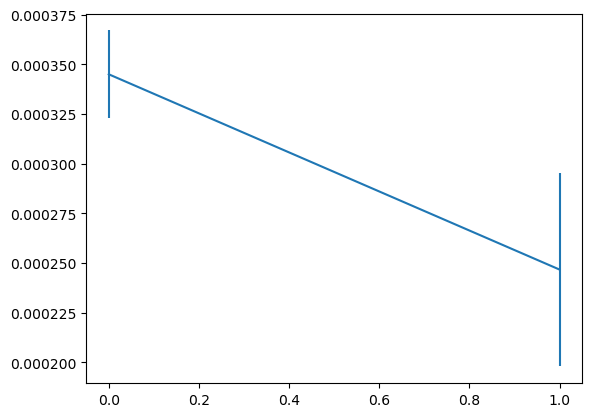

In [24]:
mean_vec = peaks_df[['mdi','lam']].groupby('mdi').agg(np.mean).loc[[1,13],'lam']
std_vec = peaks_df[['mdi','lam']].groupby('mdi').agg(np.std).loc[[1,13],'lam']
plt.errorbar(x=[0,1],y=mean_vec,yerr=std_vec,linestyle='none')

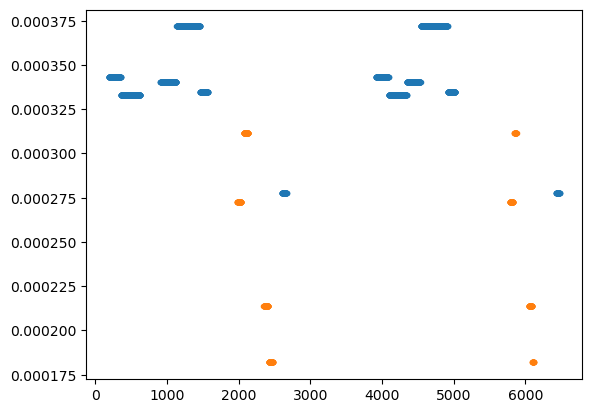

In [36]:
plt.plot(peaks_df[['mdi','lam']].groupby('mdi').get_group(1)['lam'],'.')
plt.plot(peaks_df[['mdi','lam']].groupby('mdi').get_group(13)['lam'],'.')

<ErrorbarContainer object of 3 artists>

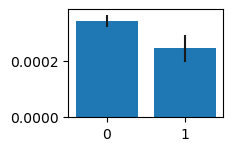

In [40]:

plt.style.use('default')
plt.style.use('fast')
plt.figure(figsize=(2,1.4))
plt.bar(x=[0,1],height=mean_vec)
plt.errorbar(x=[0,1],y=mean_vec,yerr=std_vec,linestyle='none',color='k')


In [ ]:
plt.ba